# SPRING FLOOD ANALYSIS

1. Click box below and choose sheet in excel that you want to do an analysis for.
2. Click on Cell -> Run All

In [15]:
#Choosing LTM model
# Norg, Sver, LTM1,..LTM8, LTMS
sheet = 'Norg'

In [16]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
if (code_show){
$('div.input').hide();
} else {
$('div.input').show();
}
code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')



In [17]:
import sys

path = '\\\\energycorp\\applications\\OSL\\jupyter_notebooks\\personalfolders\\MEHO\\spring-flod-analysis'
sys.path.insert(0, path)

import modules as m

%load_ext autoreload
%autoreload 2

print('\n------------------------------------------------------------------------------------------------------\n')
print('                                                  {}                                                '.format(sheet))
print('\n------------------------------------------------------------------------------------------------------\n')
file = r'spring_flod_analysis.xlsx'


#Reading in all info from chosen sheet in Excel file: 'spring_flod_analysis.xlsx' 
#and always prints dates for when saved models started from
excel_output = m.read_from_excel(sheet, file)
all_keys, idnr, start_list, end_list, excluded_list, vhhQ_OBSE_list, diff_temp_keys, comments_list, measured_list = excel_output


#Reading in all time_series from SMG and saved time series in the folders: TEMP1 and REF
all_df, all_resources = m.read_timeseries(all_keys, idnr, vhhQ_OBSE_list, diff_temp_keys, sheet, measured_list)

#change to bold letters for those who have had measured snow
if sheet[0:3] == 'LTM':
    all_keys = [r"$\bf{" + key + "}$" if key in measured_list else key for key in all_keys] 
    bold_list = [r"$\bf{" + key + "}$" for key in measured_list]
else: 
    bold_list = []
    

#Making new df for all models for analyis period
analysis_periods_output = m.find_analysis_periods(all_df, all_resources, start_list, end_list, sheet)
spring_flod_start, info_chosen_start, spring_flod_end, info_chosen_end, early_adj_start, late_adj_start = analysis_periods_output

df_analysis_period = []
for df, start, end in zip(all_df, spring_flod_start, spring_flod_end):
    df_analysis_period.append(df[start:end])
m.summary_table(df_analysis_period, all_keys, sheet, bold_list)


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload

------------------------------------------------------------------------------------------------------

                                                  Norg                                                

------------------------------------------------------------------------------------------------------

Time saved models were started from:
REF: 2019-01-01 00:00:00
TEMP1: 2019-04-04 00:00:00


,OBSE,REF,TEMP1,TEMP2,LTM,NORMAL
Norge,100510,1646.5,2343,391.3,1166.3,4596.9
Reg1,12223.3,1805.6,1657.8,1022.3,929,474.6
Reg2,32842,-171.7,-59.7,-59.7,-344.5,1932.3
Reg3,11989.1,-460,-407.5,-409.9,-410.2,536
Reg4,12024.3,195.8,703,-36.4,76.8,770.9
Reg5,14319.4,895.8,900.2,418.9,402.3,33.3
Reg6,13444.8,-330,-227.4,-227.4,-16.2,50.8
Reg7,4539.8,-124.7,-60.8,-63,6.8,-553.1
Reg8,1630.8,216.1,196.1,123.8,82,17.4


# Performance According to Accumulated Inflow [%] Error 

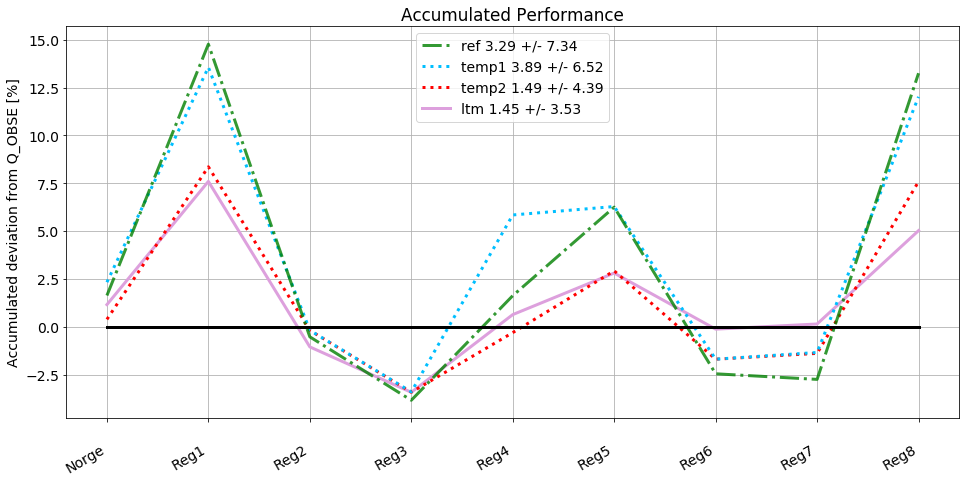

In [18]:
#Calculating performance of the models
acc_perf_all = m.calc_performance(all_df, all_keys, spring_flod_start, spring_flod_end, bold_list) 

#plot performance for models in the LTM model
m.plot_perf_models(acc_perf_all, sheet, perfType='Accumulated')


## BOX AND WHISKER PLOT ACCUMULATIVE DEVIATION FROM Q_OBSE

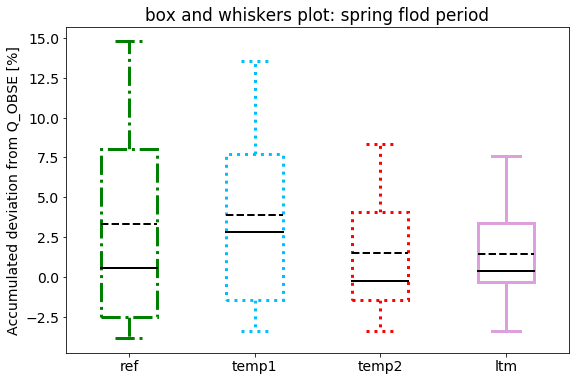

In [19]:
#Excluding columns that are chosen to be excluded in the Excel document
excluded_keys = m.exclude_keys(all_keys, excluded_list)

# calculationg preformance for included keys
acc_perf_inc = m.calc_performance(all_df, all_keys, spring_flod_start, spring_flod_end, excluded_keys) 

if sheet == 'Norg':
    acc_perf = acc_perf_inc.drop('Norge')
elif sheet == 'Sver':
    acc_perf = acc_perf_inc.drop('Sverige')
else:
    acc_perf = acc_perf_inc


m.box_plot(acc_perf)

if len(bold_list) > 0:
    print("\n\nCATCHMENTS WITH SNOW MEASUREMENTS ONLY:")
    acc_perf_measured = acc_perf.drop([key for key in all_keys if key not in bold_list])
    m.box_plot(acc_perf_measured)

## SNOW ADJUSTMENTS: BETTER or WORSE?

Reg1 14.636734044524854 13.467731398649905
Reg4 1.53036787240617 4.677679675358803
Reg6 -3.9428343396102377 -3.240293008844567
Reg7 -2.71676474280987 -1.3052923836574775
Reg8 15.510365953835192 14.22786963190115


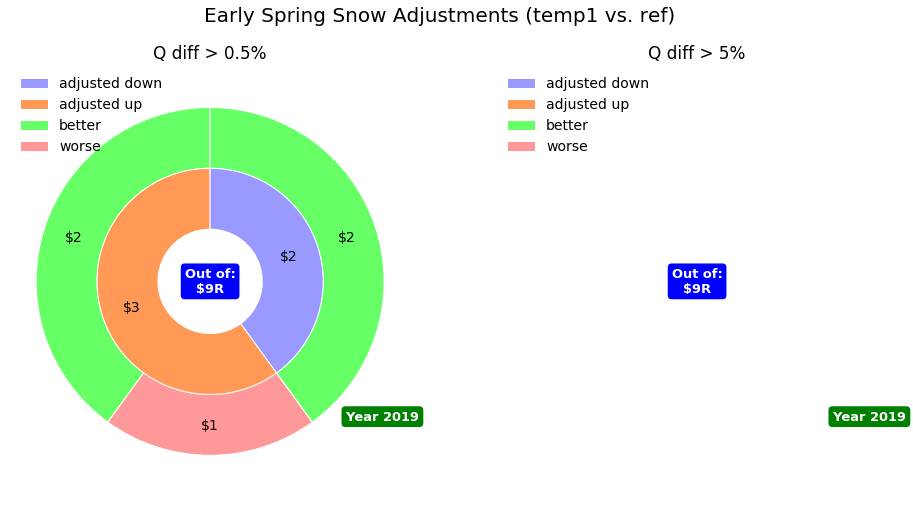

Norge 1.4885868406426812 -0.8510477860510417
Reg1 13.123806615346236 5.863716358652406
Reg4 4.485259968898368 -3.335191557612891
Reg5 3.723696480768272 -0.6570784042933348
Reg7 24.78900404371392 23.742271442622737
Reg8 18.377822740513107 12.646402640825938
Reg1 13.123806615346236 5.863716358652406
Reg4 4.485259968898368 -3.335191557612891
Reg8 18.377822740513107 12.646402640825938


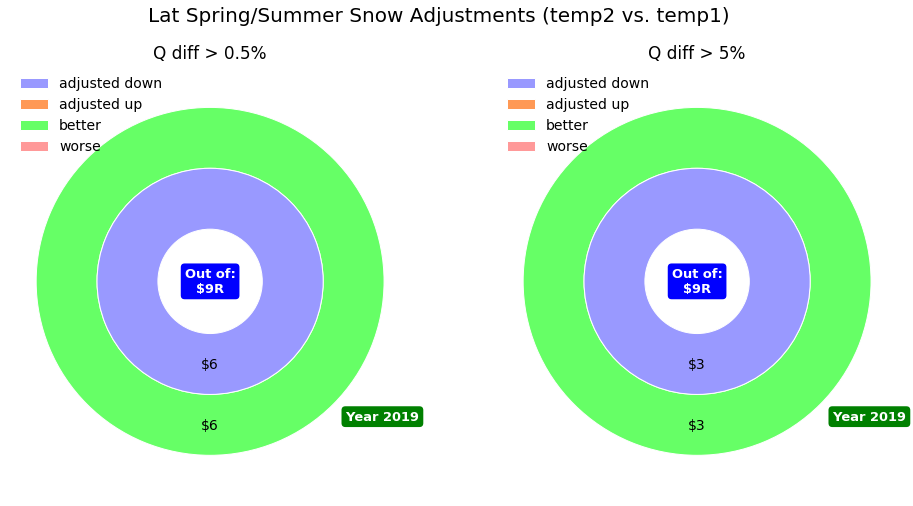

In [20]:
# calculationg preformance for included keys and first analysis period
acc_perf_adj1 = m.calc_performance(all_df, all_keys, early_adj_start, spring_flod_end, excluded_keys) 
if list(acc_perf_adj1['ref'].values) != list(acc_perf_adj1['temp1'].values):
    m.pie_subplot_perf(acc_perf_adj1, sheet, 'ref', 'temp1')


# calculationg preformance for included keys and first analysis period
acc_perf_adj2 = m.calc_performance(all_df, all_keys, late_adj_start, spring_flod_end, excluded_keys) 
if list(acc_perf_adj2['temp1'].values) != list(acc_perf_adj2['temp2'].values):
    m.pie_subplot_perf(acc_perf_adj2, sheet, 'temp1', 'temp2')


# Induvidual Analysis for Each Model




------------------------------------------------------------------------------------------------------------------------
                                                        Norge
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-04-01 00:00): read from excel.
WARNING! Analysis end (2019-09-28): this script did not find a sufficient estimation of the end of the spring flod, used here last possible end.


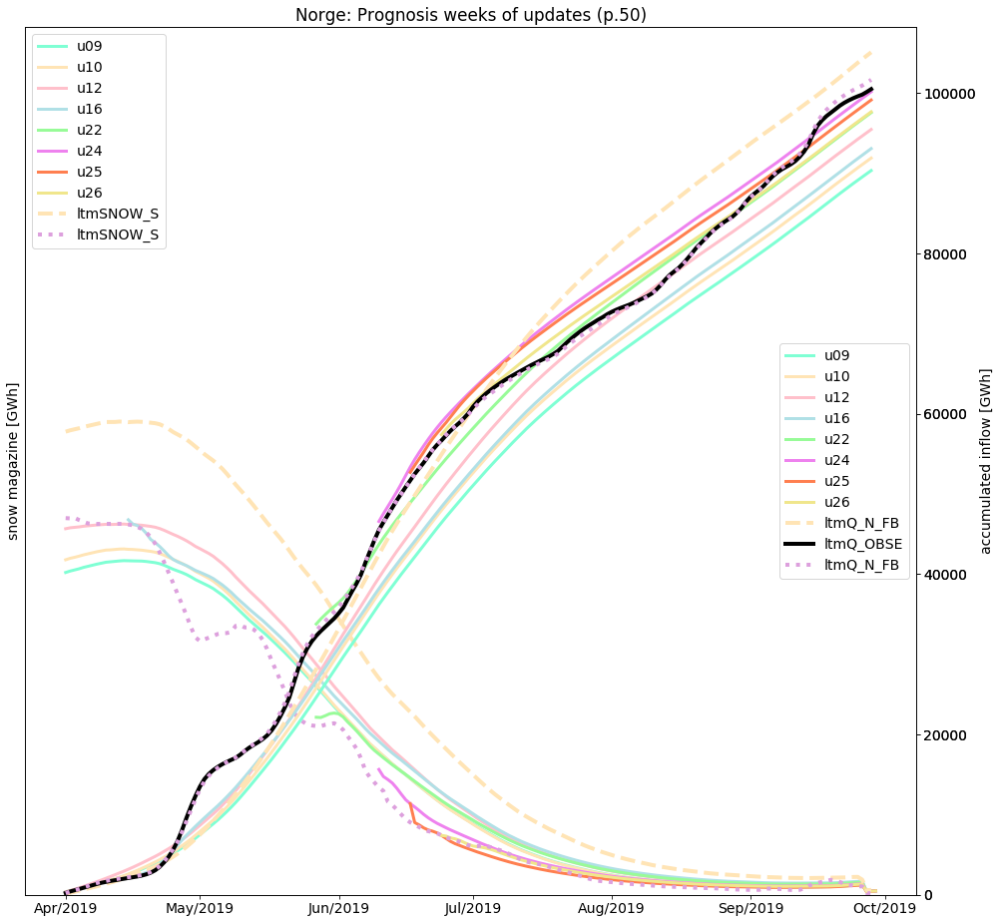

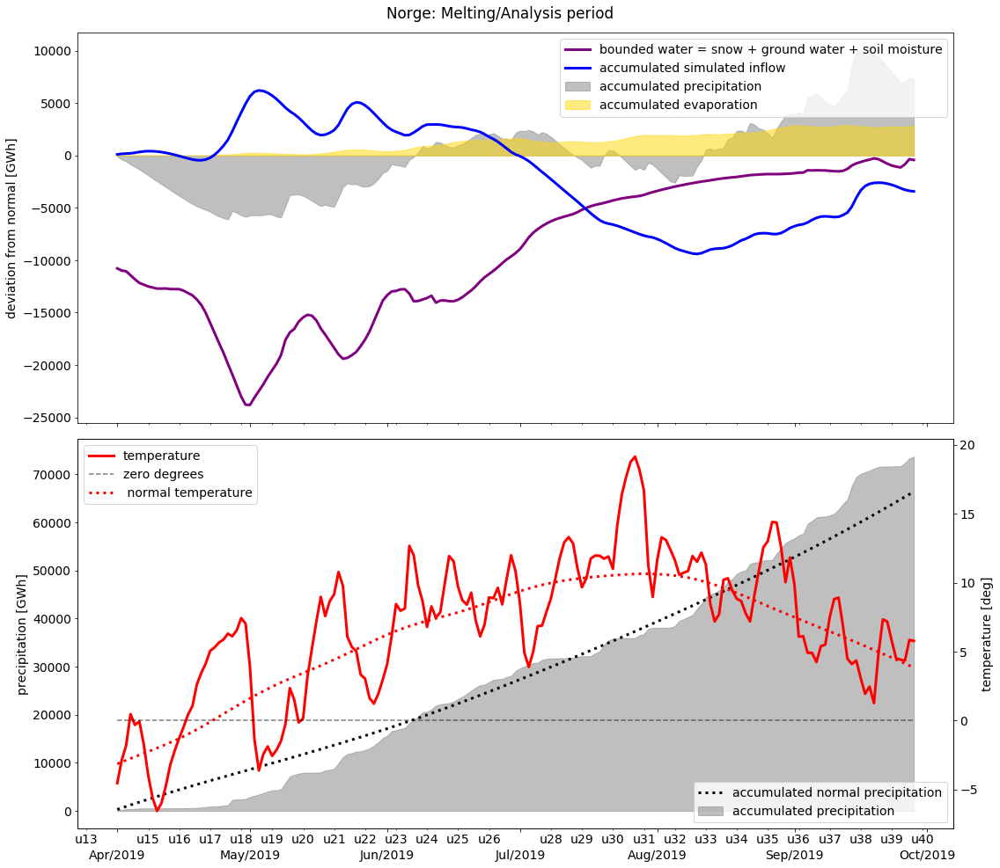

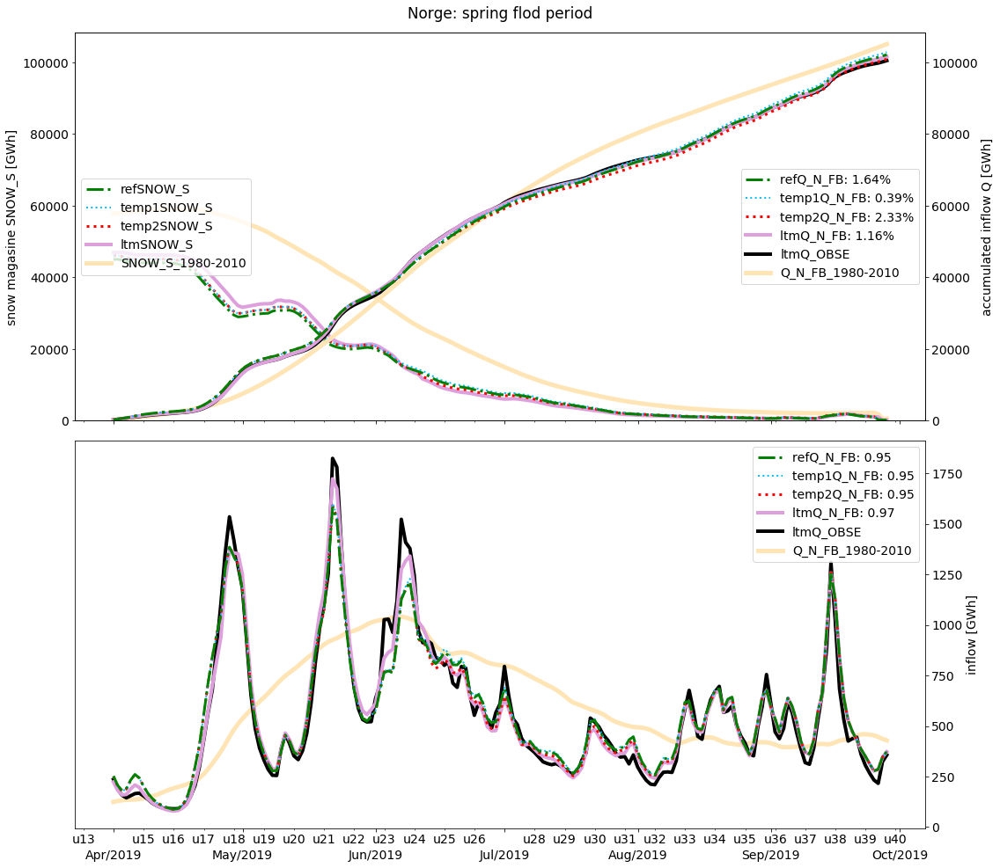

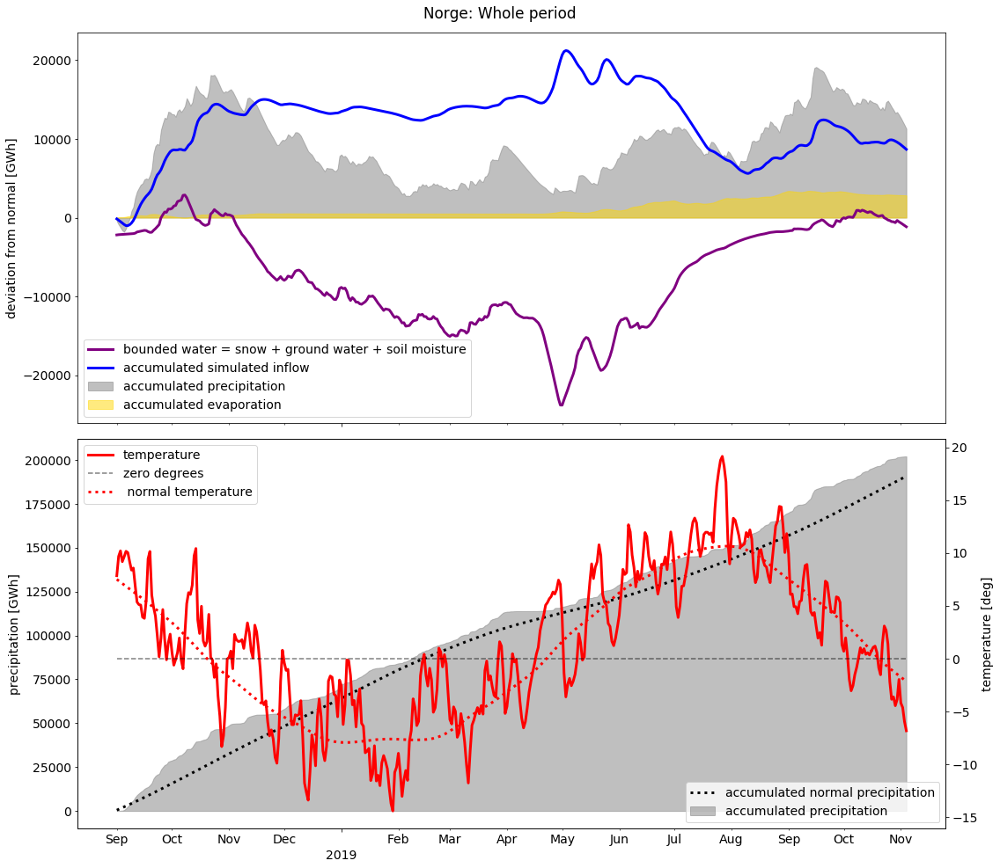

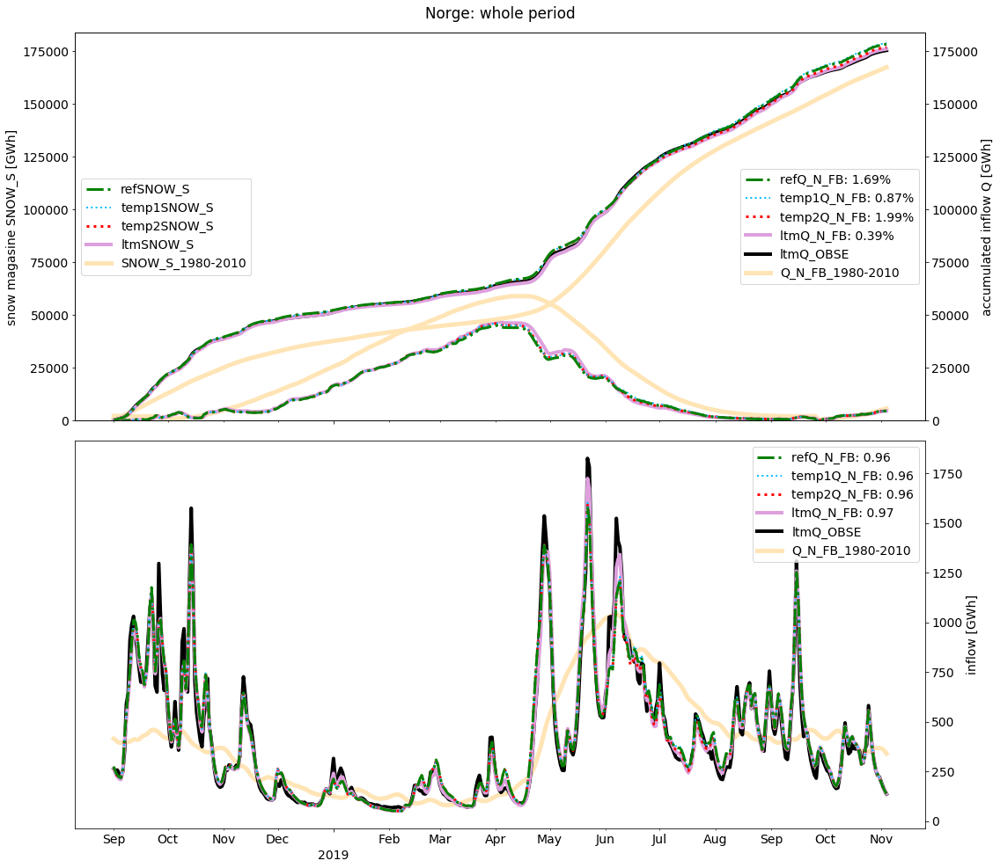








------------------------------------------------------------------------------------------------------------------------
                                                        Reg1
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-02-15 00:00): read from excel.
WARNING! Analysis end (2019-09-01): this script did not find a sufficient estimation of the end of the spring flod, used here date for the ref snow magasine minimum.
snowjust_dict =  {'u09': ['Sælatun-002.284'], 'u24': ['Etna-012.007'], 'u25': ['Liavatn-002.275', 'Nore.1-015.011', 'Sjodals-002.013', 'Sælatun-002.284'], 'u22': ['Nybergs-311.006']}

Models updated in explicit weeek:
u09: ['Sælatun-002.284']
u22: ['Nybergs-311.006']
u24: ['Etna-012.007']
u25: ['Liavatn-002.275', 'Nore.1-015.011', 'Sjodals-002.013', 'Sælatun-002.284']


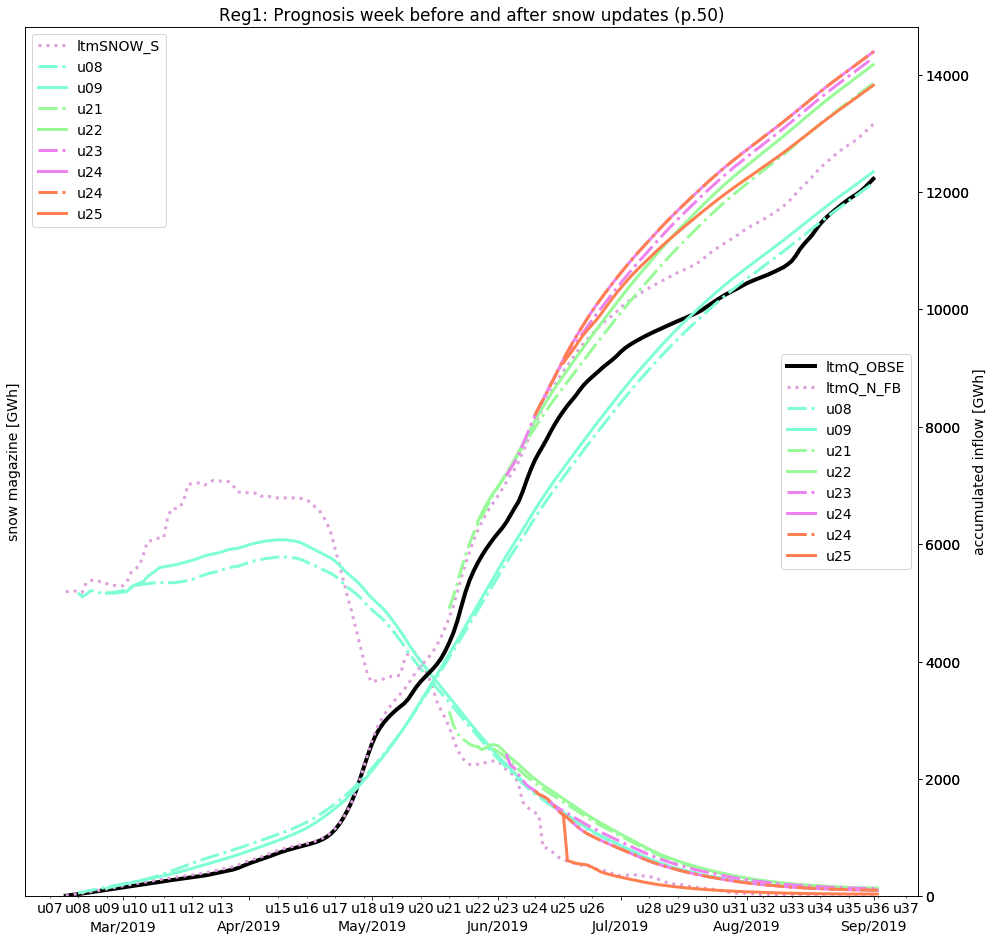

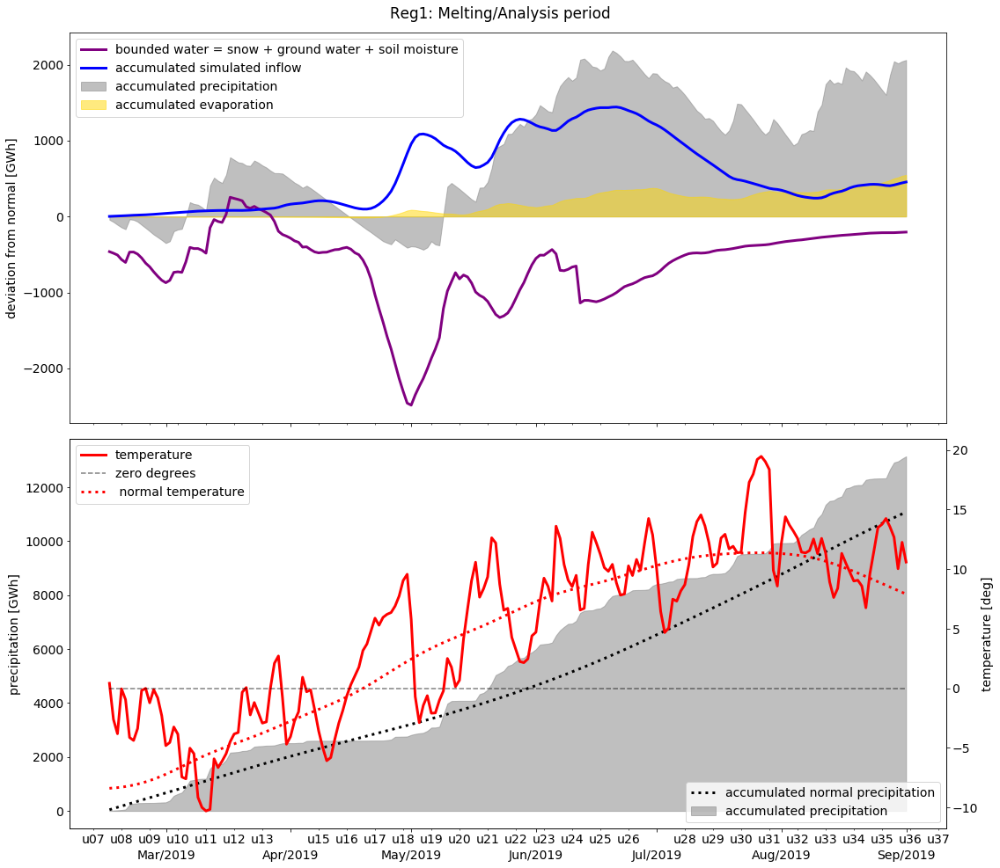

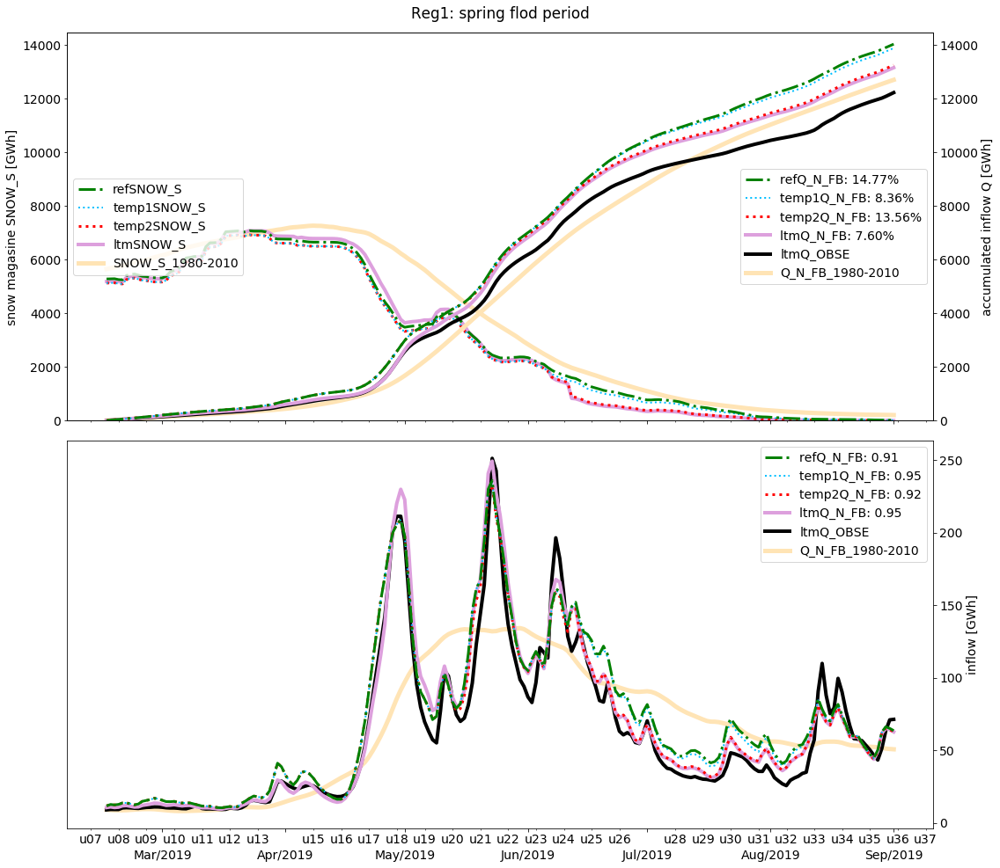

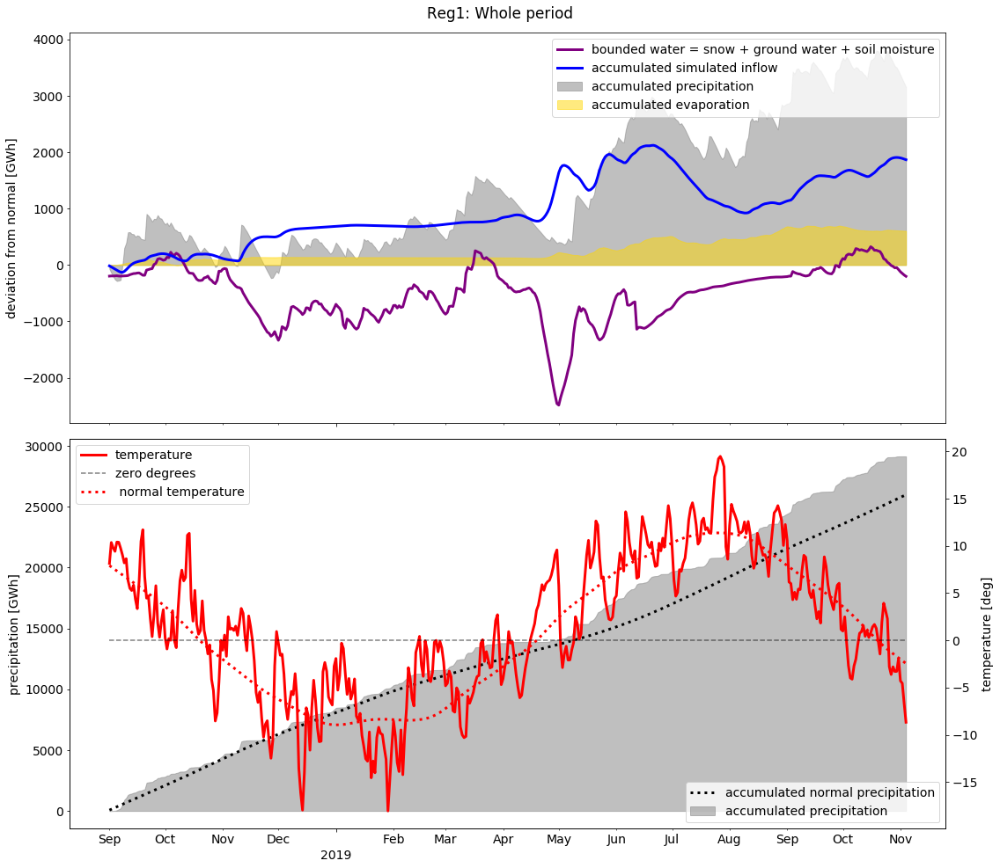

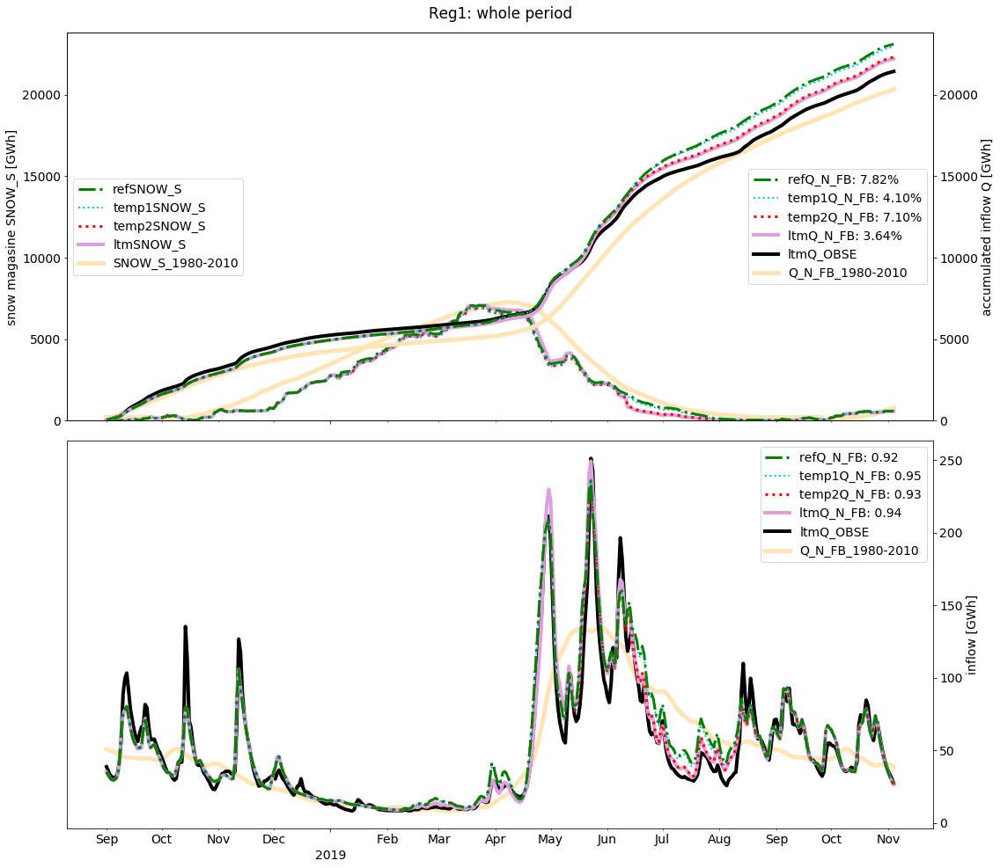








------------------------------------------------------------------------------------------------------------------------
                                                        Reg2
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-02-15 00:00): read from excel.
WARNING! Analysis end (2019-09-28): this script did not find a sufficient estimation of the end of the spring flod, used here last possible end.
snowjust_dict =  {'u16': ['Jogla-026.026', 'Roskrep-025.029', 'Tingvat-024.009'], 'u12': ['Mår....-016.198', 'Saurdal_Bykle', 'Songa..-016.185', 'Songa_Møsvatn'], 'u10': ['Saurdal-036.048'], 'u24': ['Tysso-2-049.002']}

Models updated in explicit weeek:
u10: ['Saurdal-036.048']
u12: ['Mår....-016.198', 'Saurdal_Bykle', 'Songa..-016.185', 'Songa_Møsvatn']
u16: ['Jogla-026.026', 'Roskrep-025.029', 'Tingvat-024.009']
u24: ['Tysso-2-049.002']


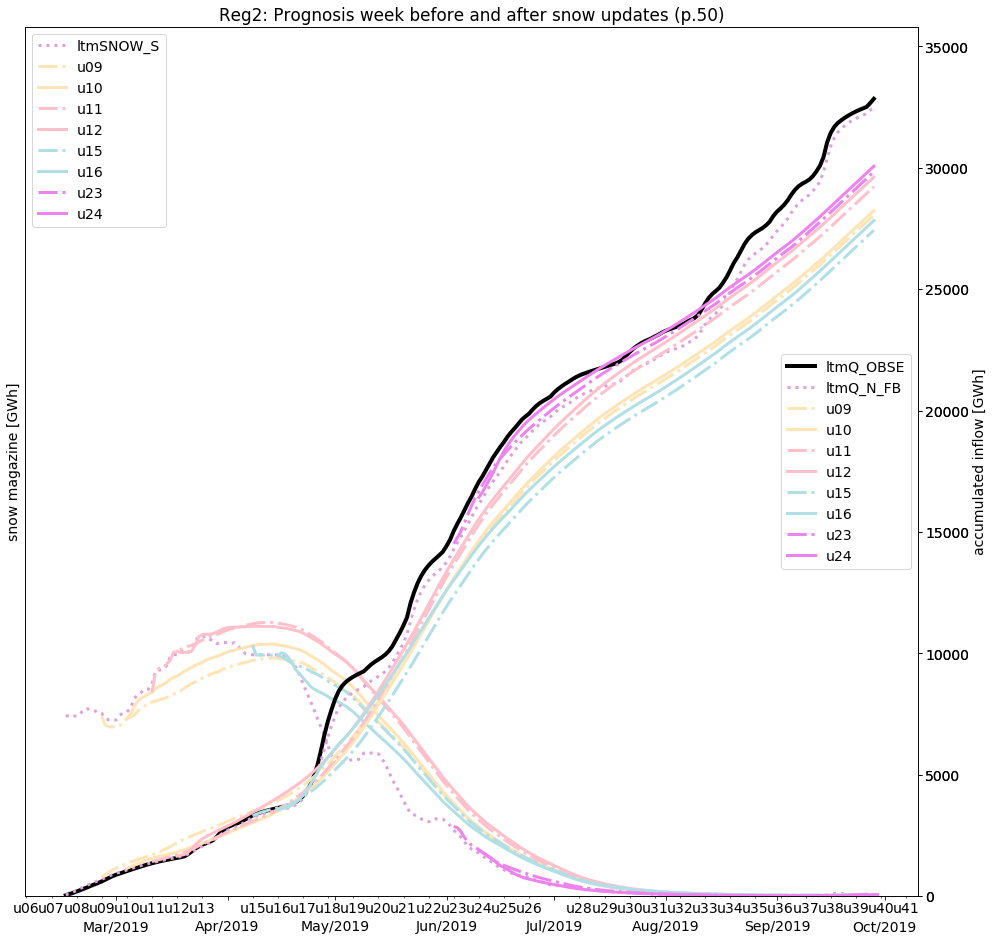

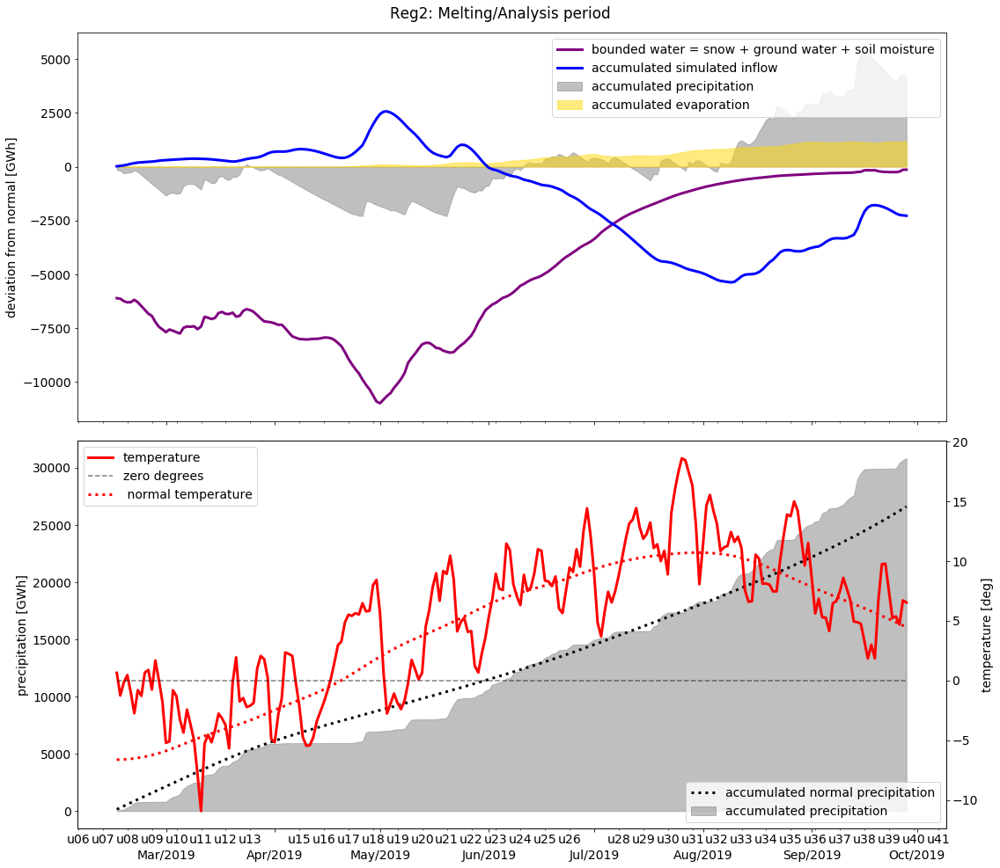

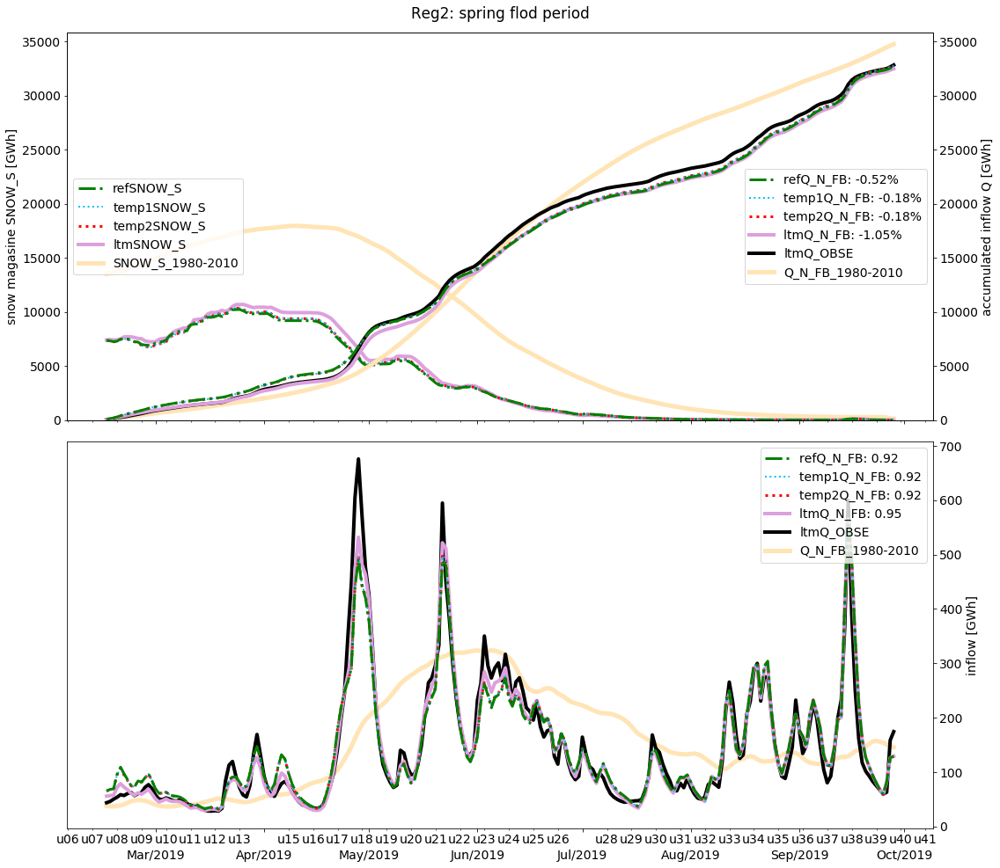

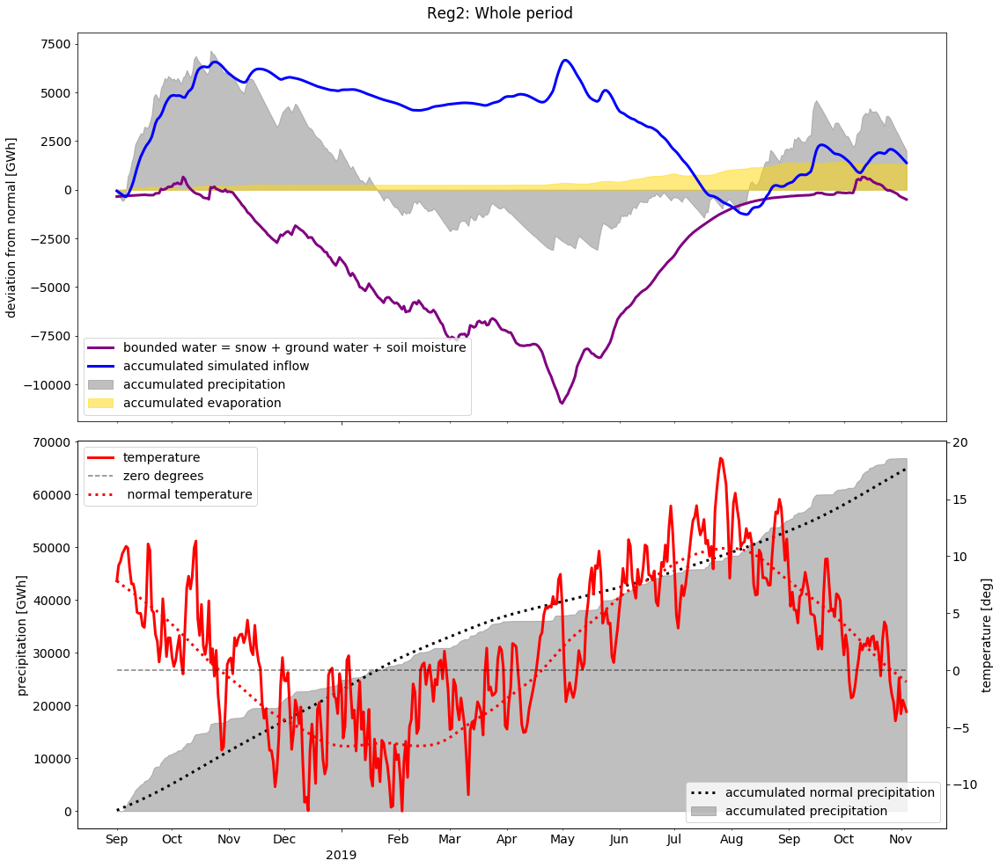

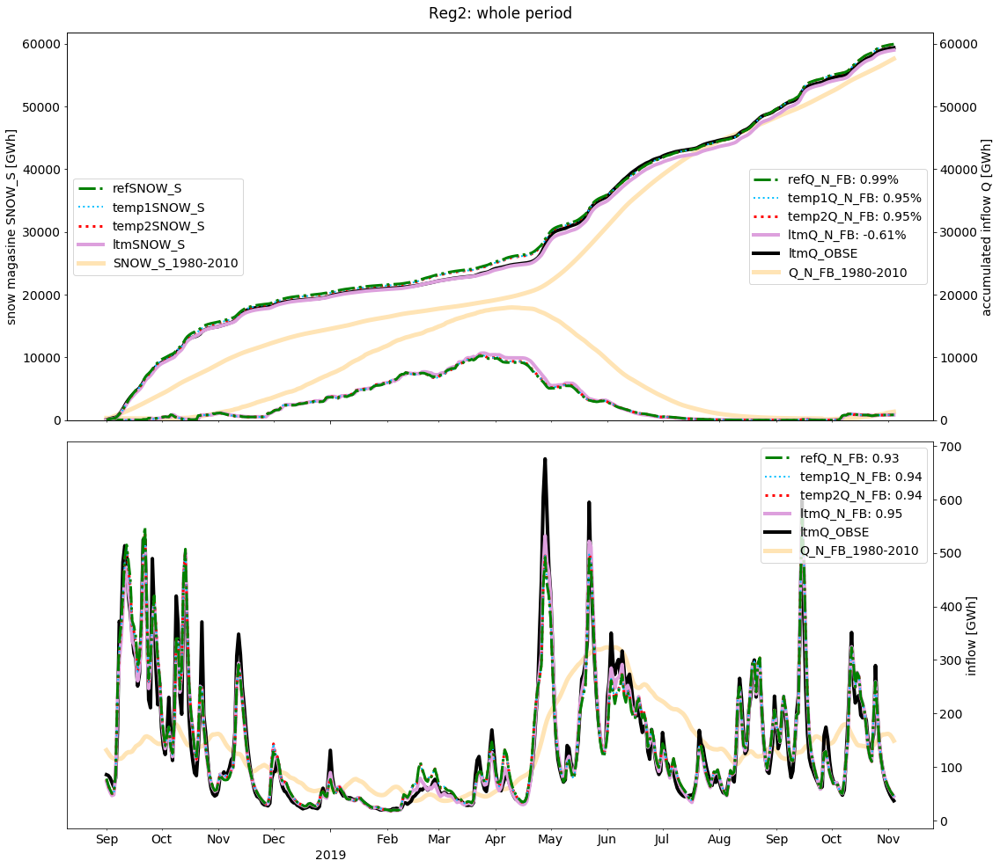








------------------------------------------------------------------------------------------------------------------------
                                                        Reg3
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-02-01 00:00): read from excel.
WARNING! Analysis end (2019-09-28): this script did not find a sufficient estimation of the end of the spring flod, used here last possible end.
snowjust_dict =  {'u10': ['Josteda-076.003', 'Leirdøl-076.030']}

Models updated in explicit weeek:
u10: ['Josteda-076.003', 'Leirdøl-076.030']


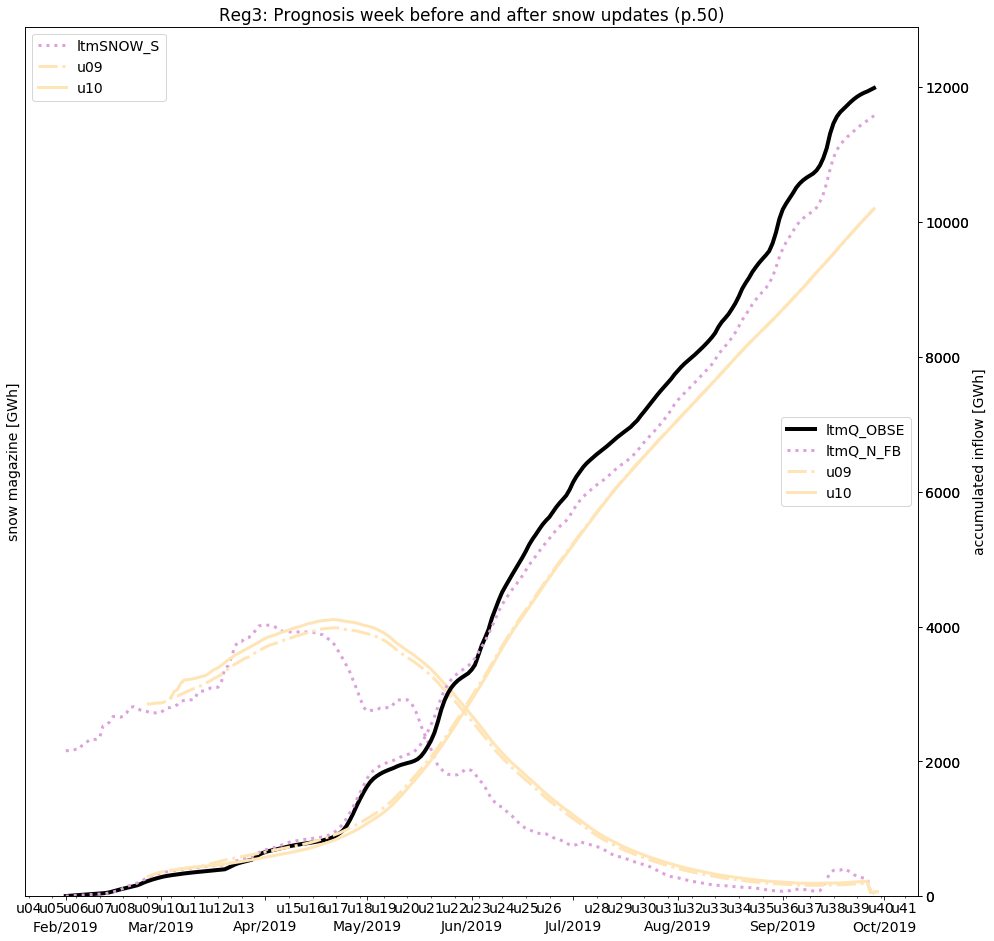

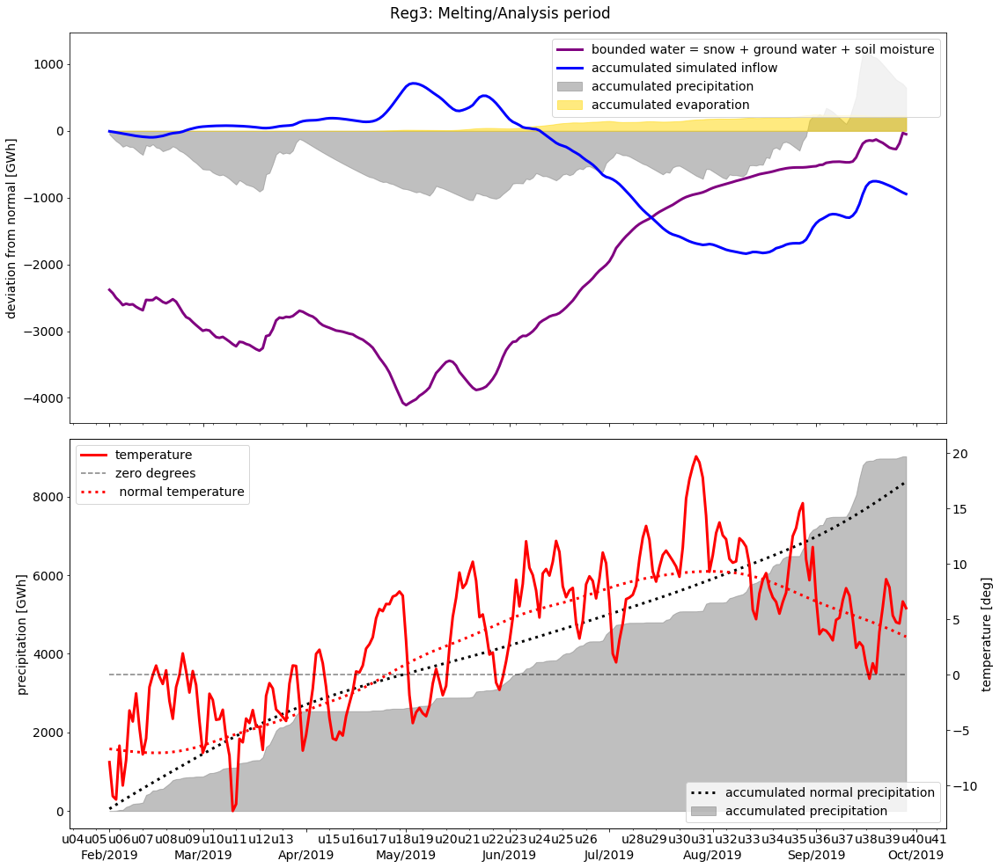

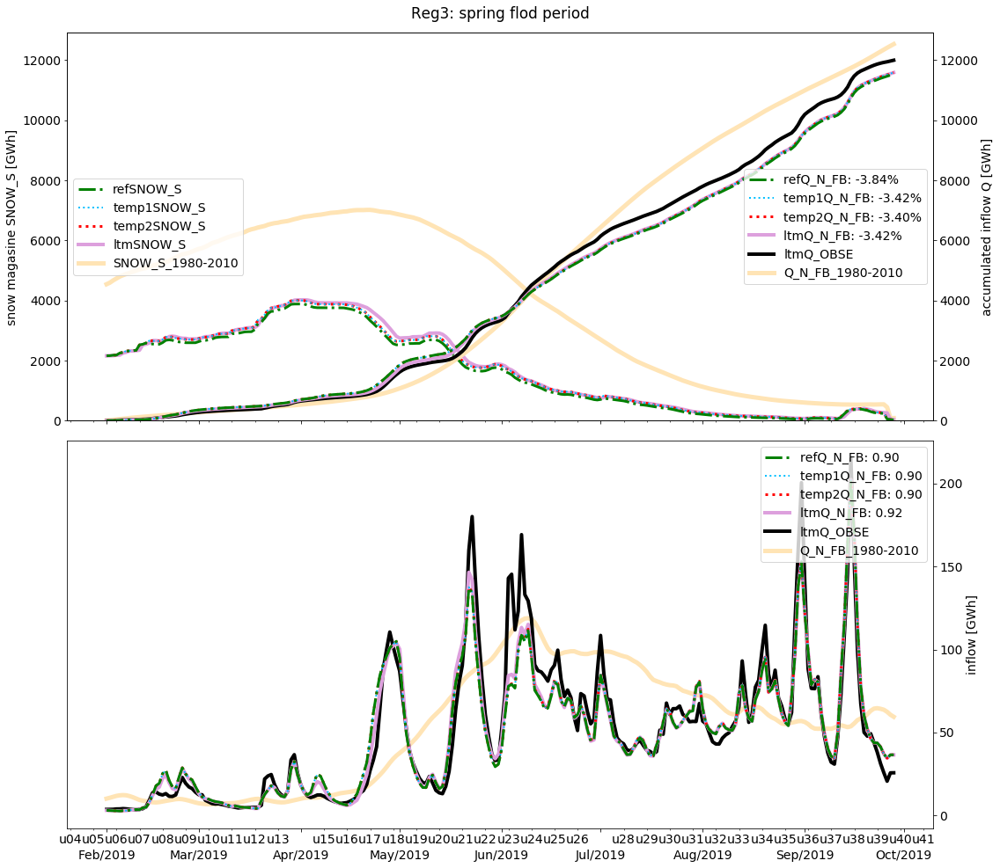

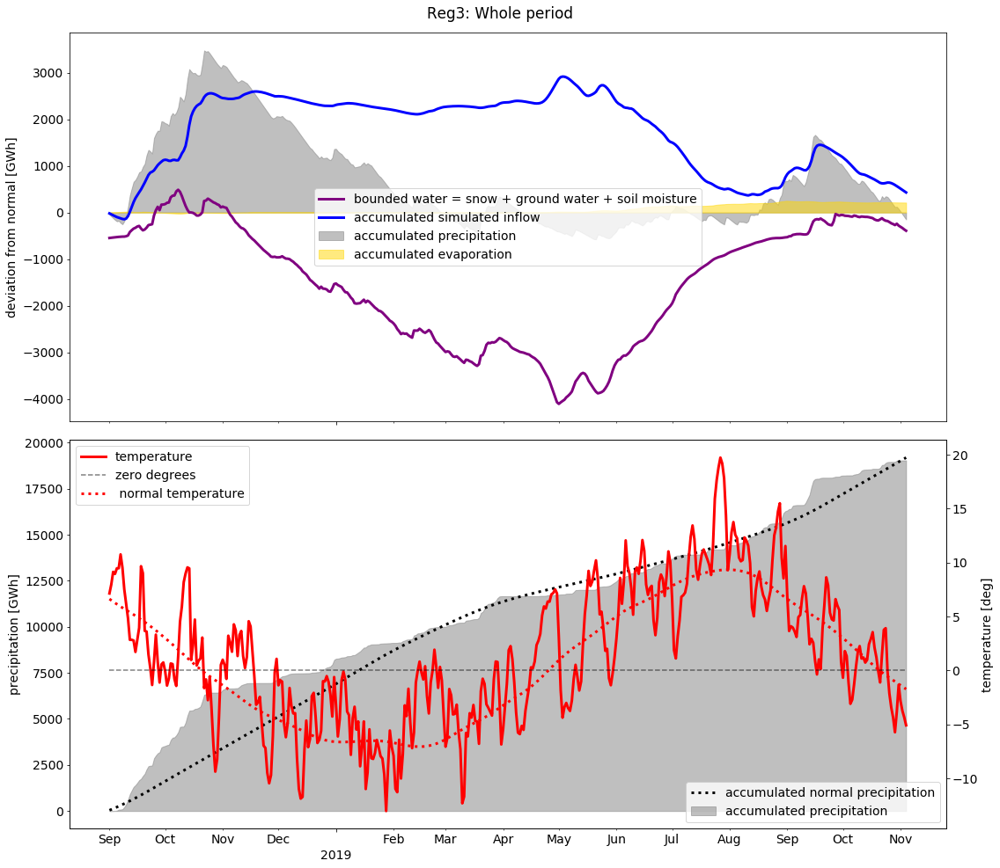

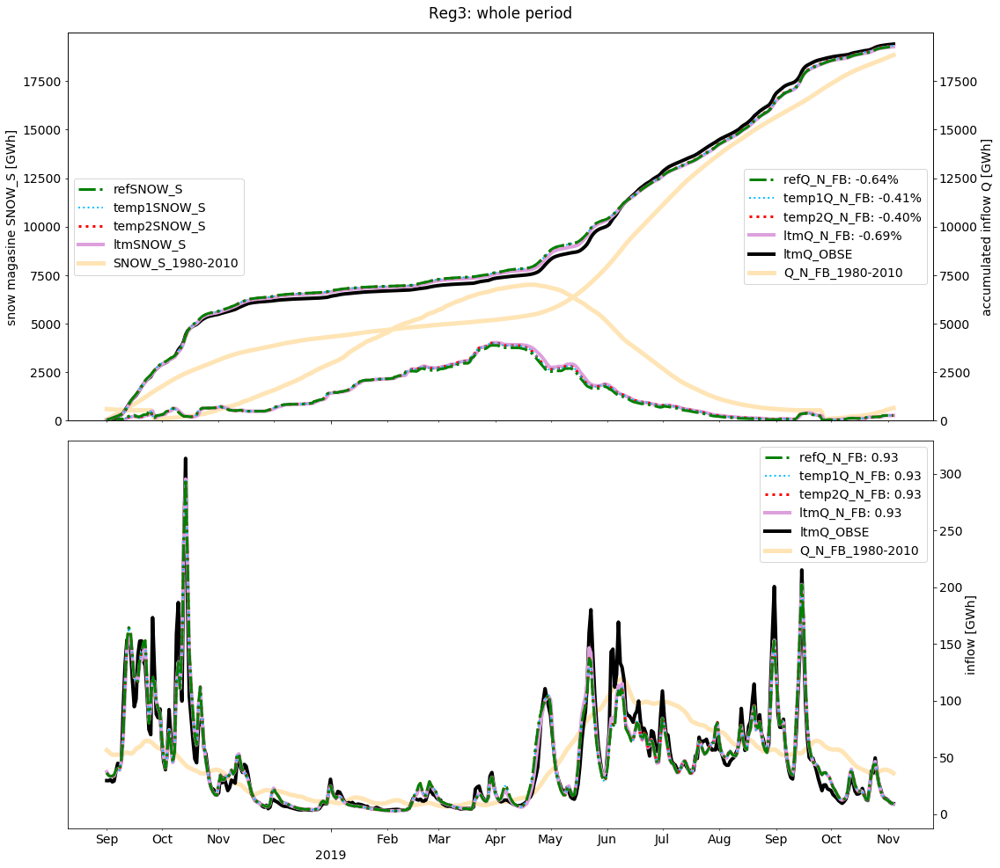








------------------------------------------------------------------------------------------------------------------------
                                                        Reg4
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-02-01 00:00): read from excel.
WARNING! Analysis end (2019-08-30): this script did not find a sufficient estimation of the end of the spring flod, used here date for the ref snow magasine minimum.
snowjust_dict =  {'u09': ['Aurland.1'], 'u12': ['BrekkeB-072.005', 'Langsim-050.051', 'Sysima-050.015'], 'u24': ['Etna-012.007'], 'u26': ['Grunke-012.197'], 'u25': ['Nore.1-015.011', 'Storesk-012.215']}

Models updated in explicit weeek:
u09: ['Aurland.1']
u12: ['BrekkeB-072.005', 'Langsim-050.051', 'Sysima-050.015']
u24: ['Etna-012.007']
u25: ['Nore.1-015.011', 'Storesk-012.215']
u26: ['Grunke-012.197']


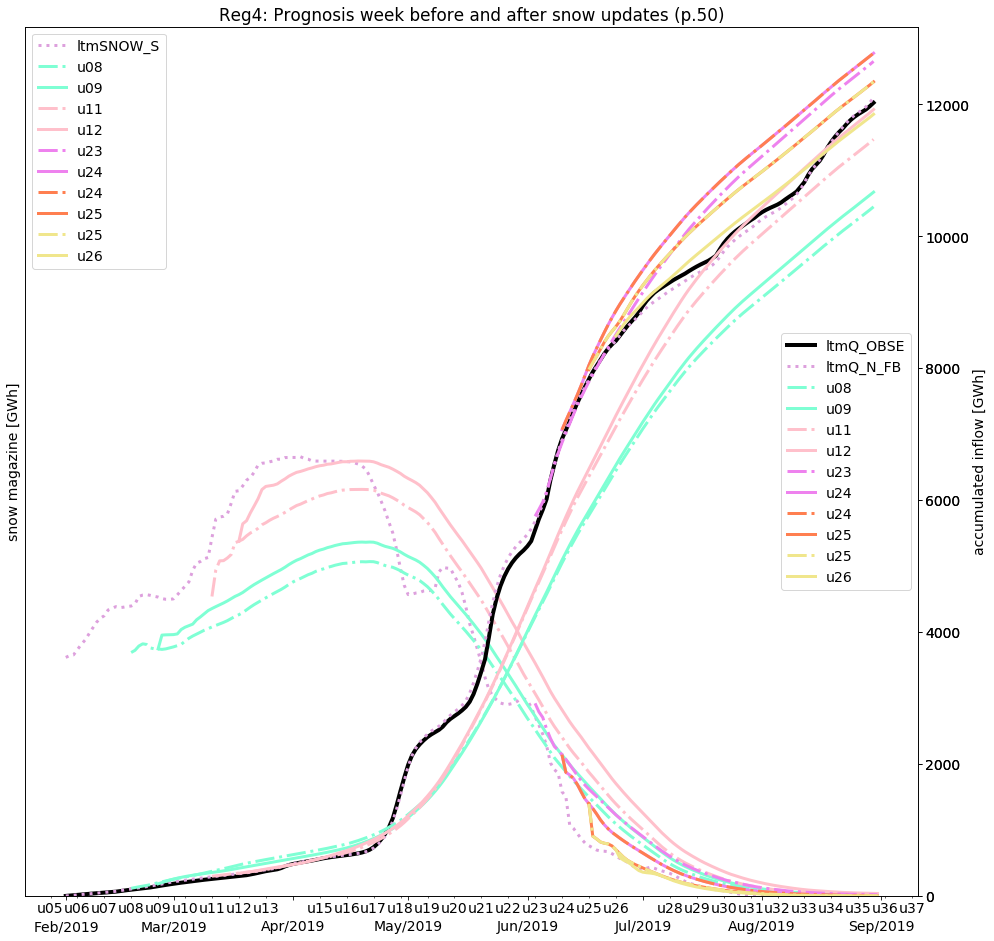

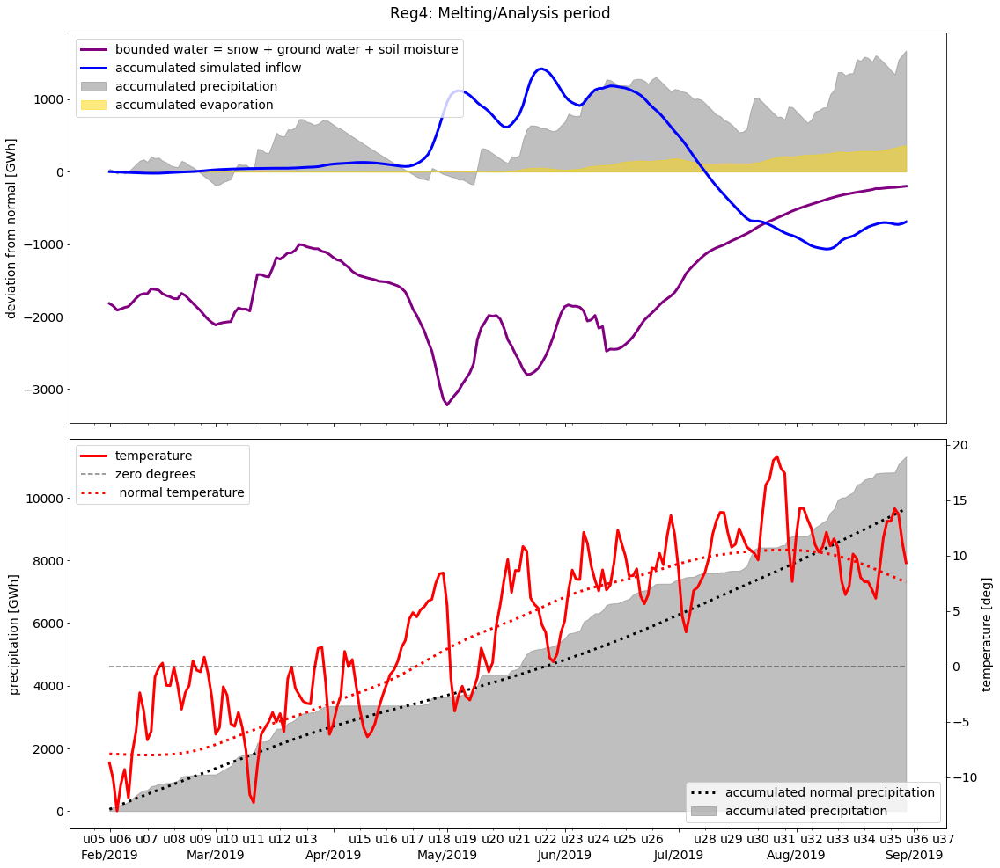

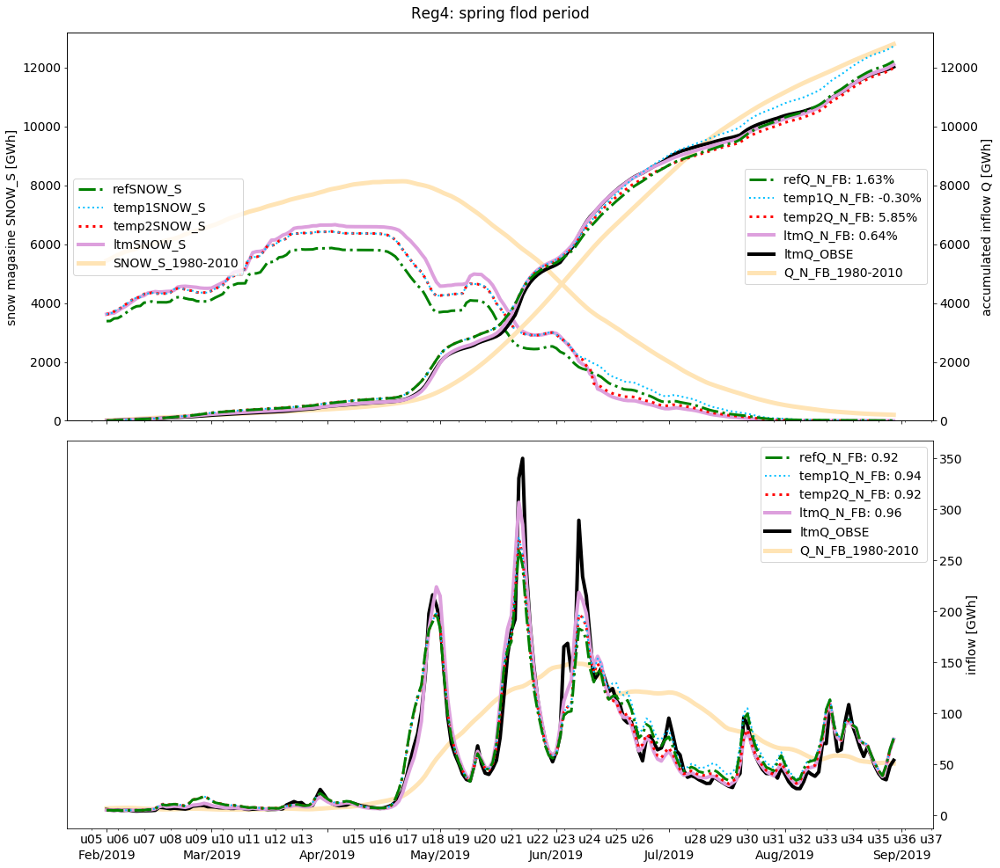

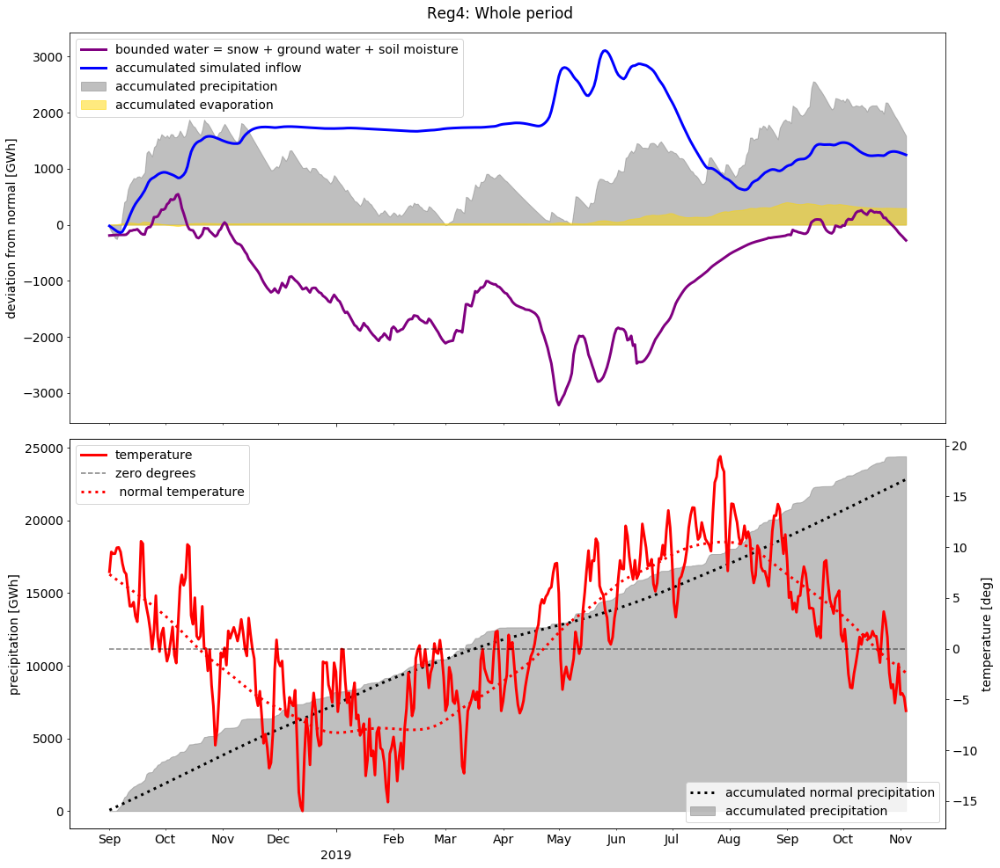

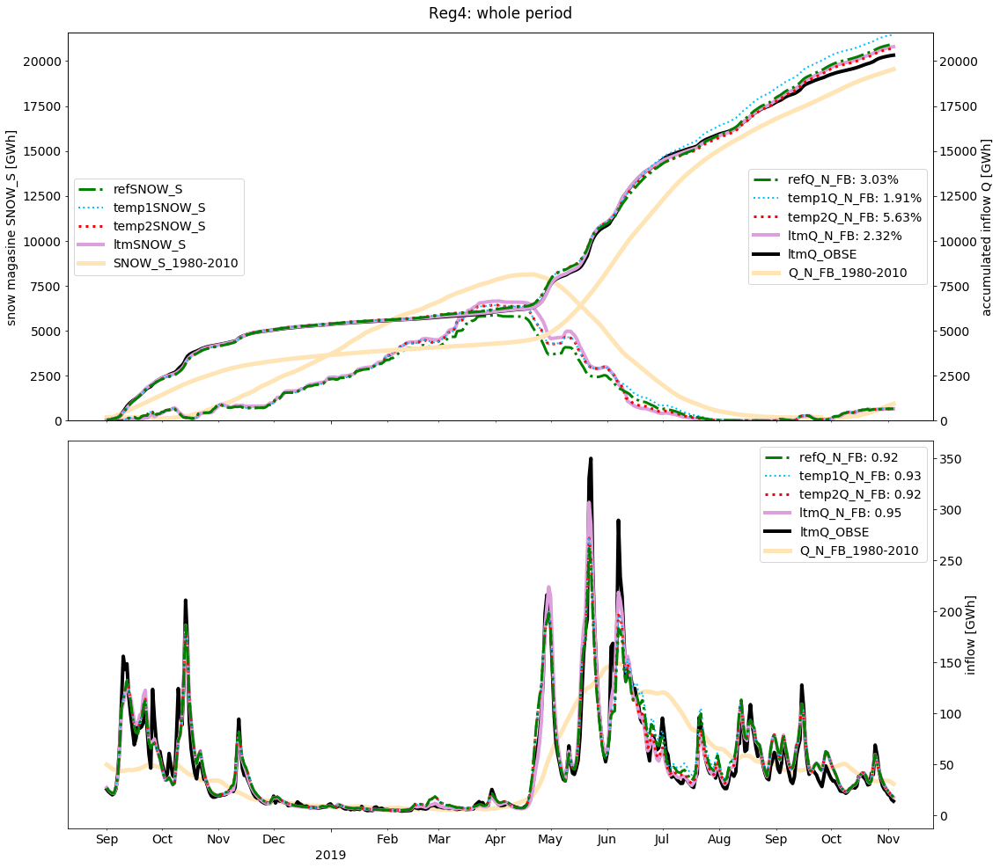








------------------------------------------------------------------------------------------------------------------------
                                                        Reg5
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-03-01 00:00): read from excel.
WARNING! Analysis end (2019-09-28): this script did not find a sufficient estimation of the end of the spring flod, used here last possible end.
snowjust_dict =  {'u12': ['Aura-109.033', 'Høy.K5A-079.014', 'Tya-123.999'], 'u25': ['Gråsjø-112.014', 'Rinna-112.008', 'Trollhe-112.015'], 'u24': ['Høggås-124.002']}

Models updated in explicit weeek:
u12: ['Aura-109.033', 'Høy.K5A-079.014', 'Tya-123.999']
u24: ['Høggås-124.002']
u25: ['Gråsjø-112.014', 'Rinna-112.008', 'Trollhe-112.015']


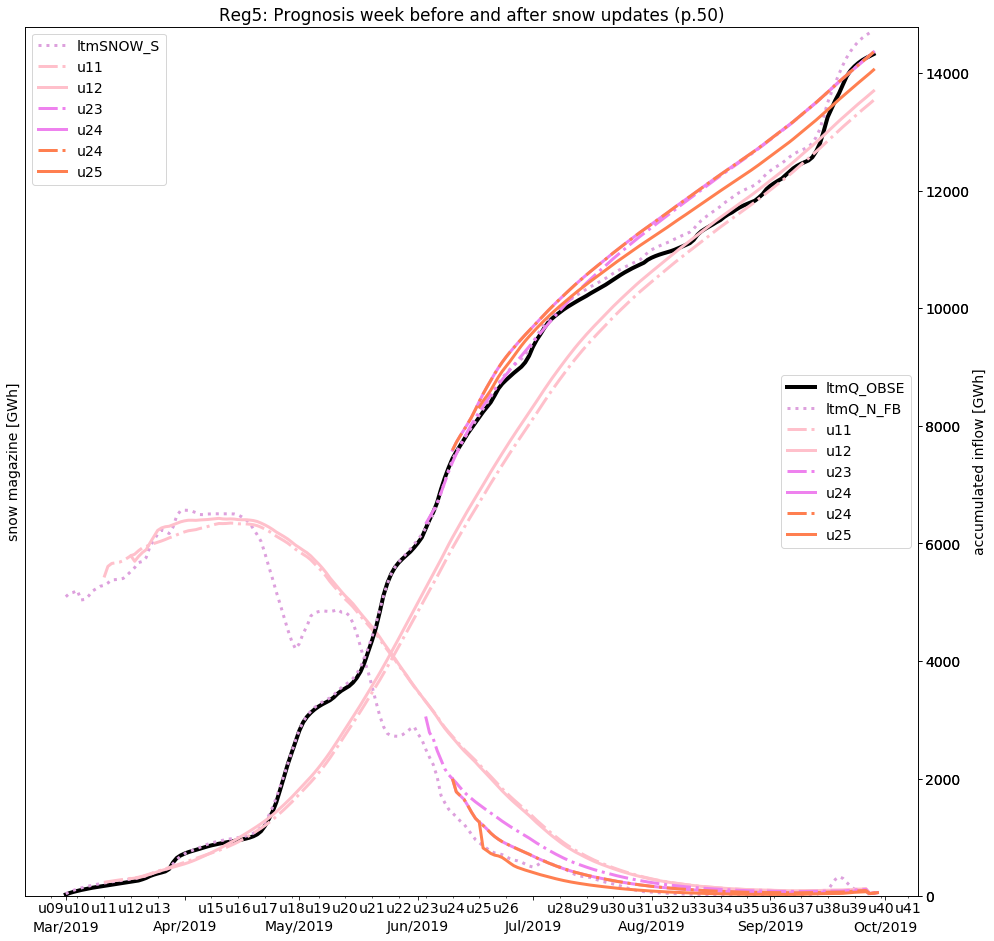

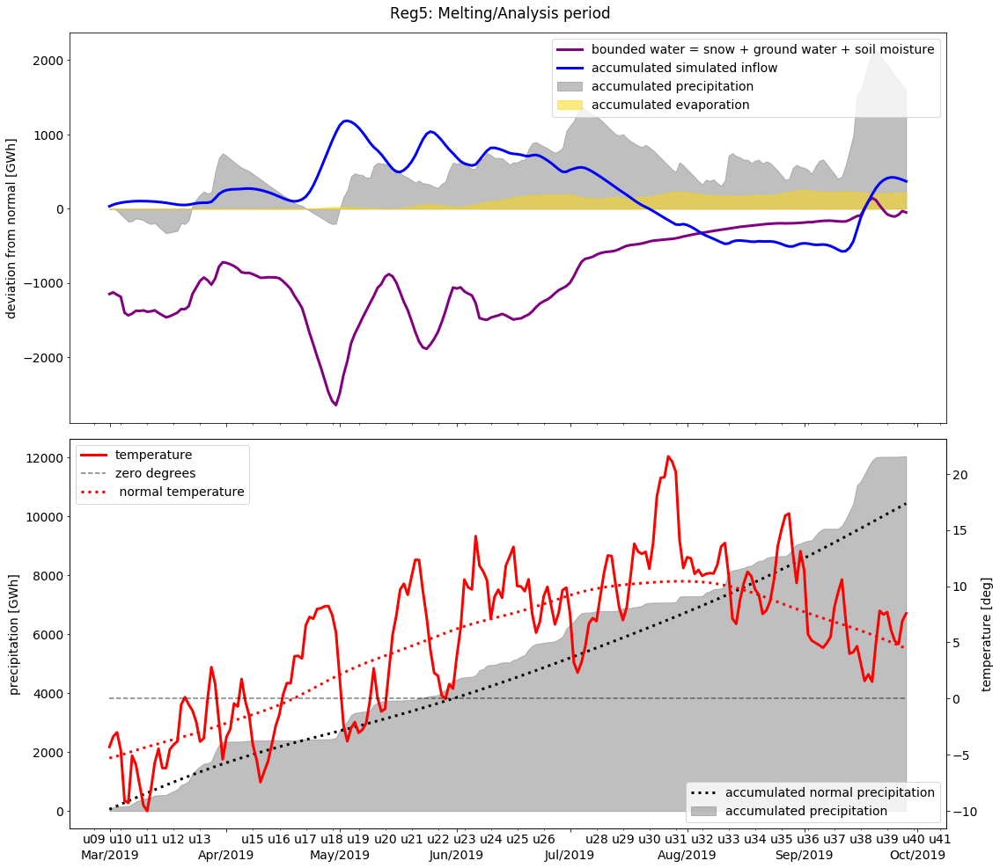

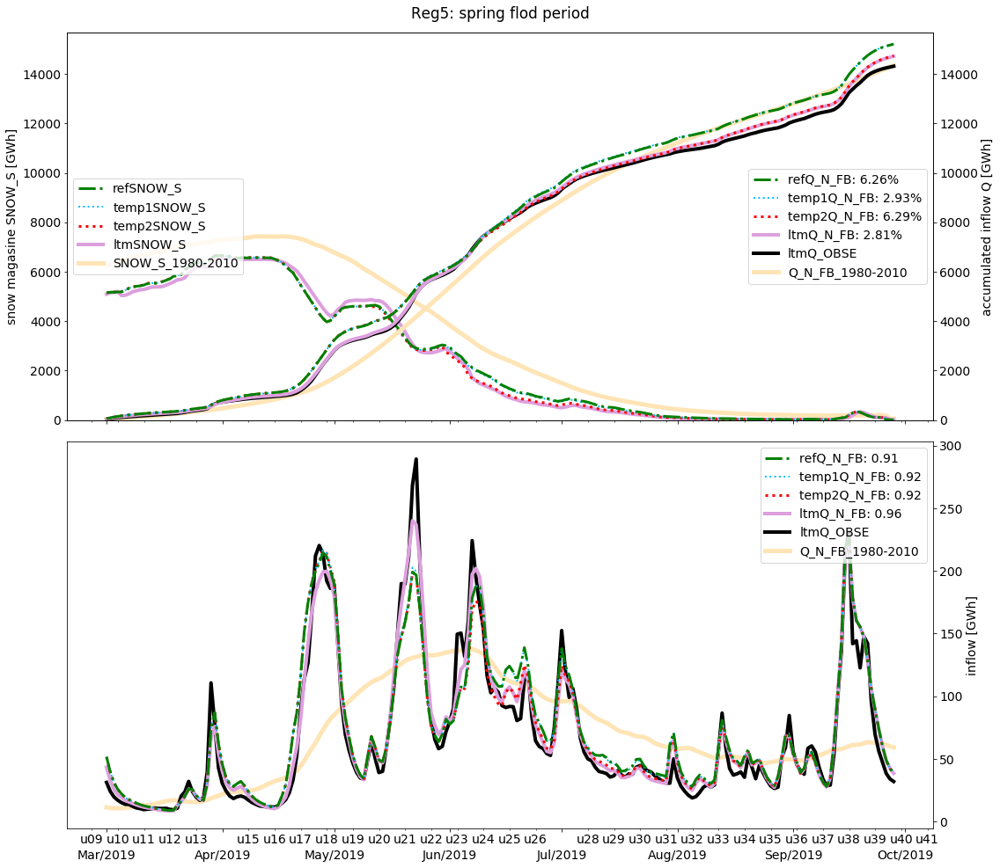

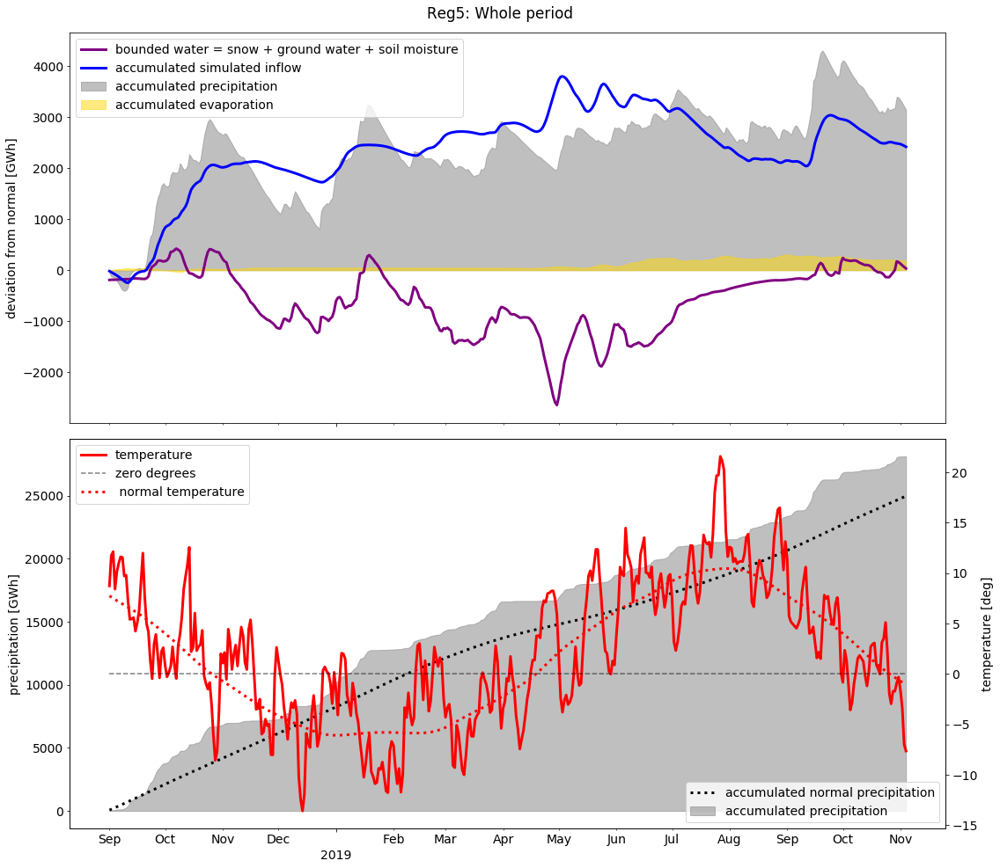

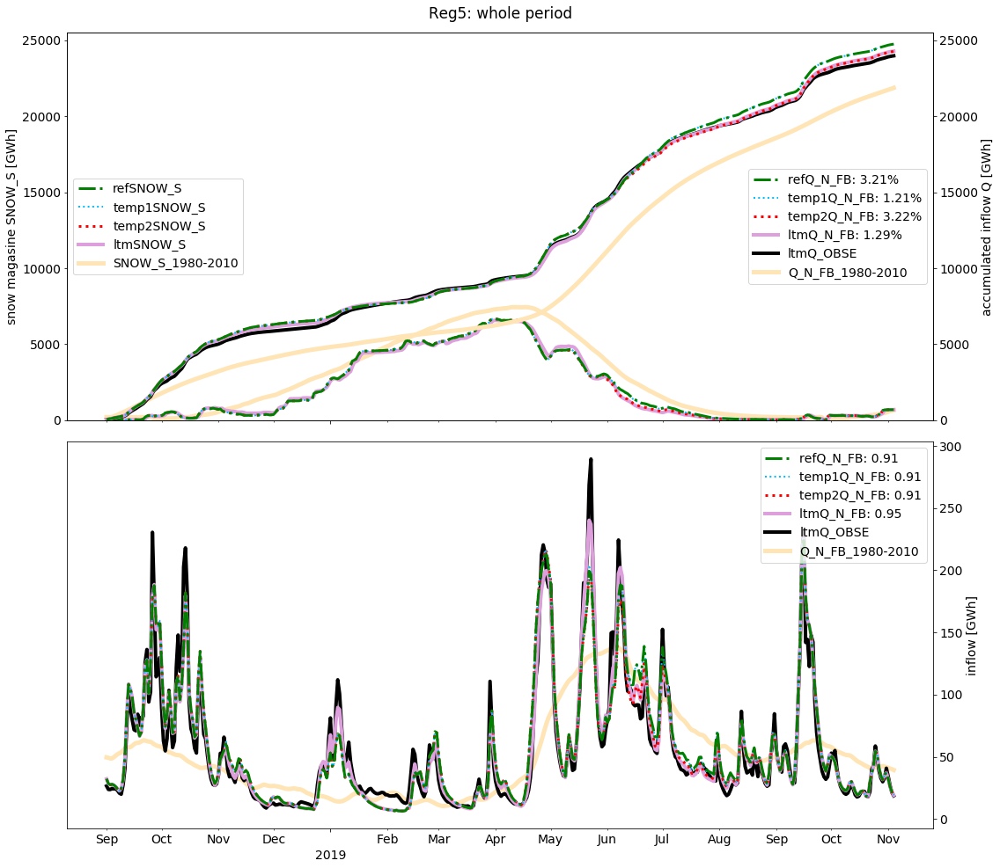








------------------------------------------------------------------------------------------------------------------------
                                                        Reg6
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-03-01 00:00): read from excel.
WARNING! Analysis end (2019-09-28): this script did not find a sufficient estimation of the end of the spring flod, used here last possible end.
snowjust_dict =  {'u12': ['LTM6-Kobbelv-167.034', 'LTM6-Svartis-159.014'], 'u16': ['LTM6-Røssvat-155.021']}

Models updated in explicit weeek:
u12: ['LTM6-Kobbelv-167.034', 'LTM6-Svartis-159.014']
u16: ['LTM6-Røssvat-155.021']


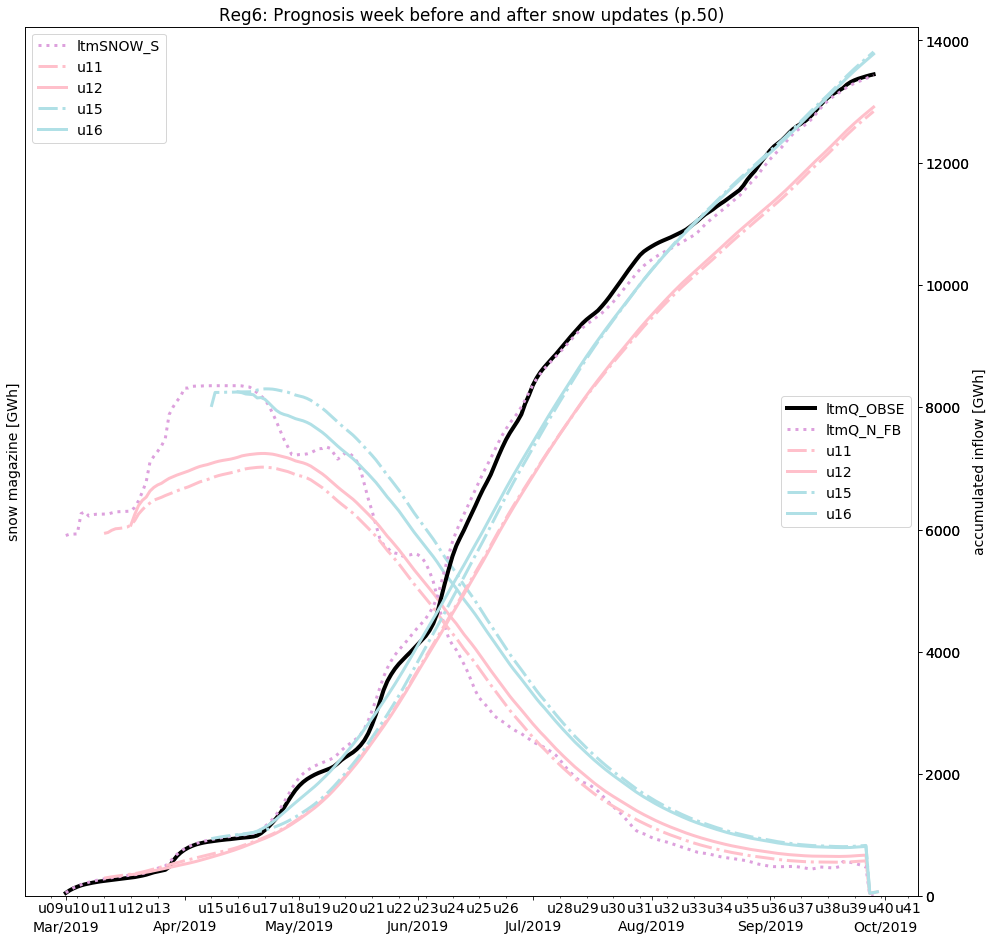

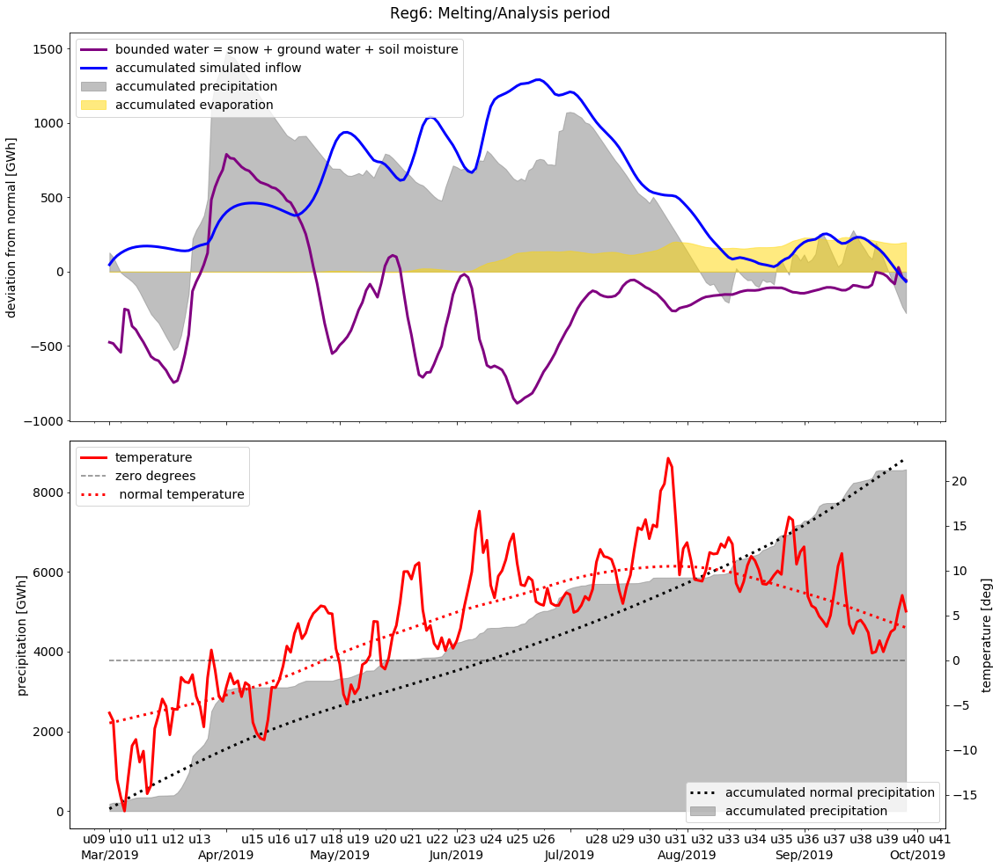

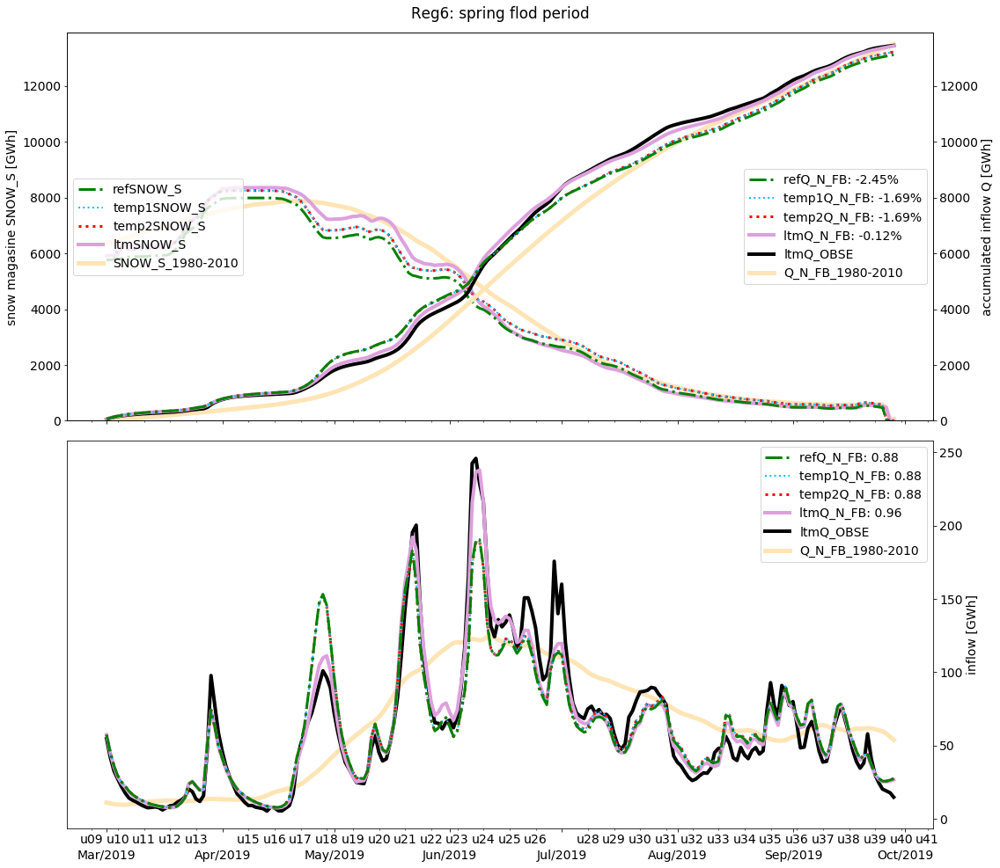

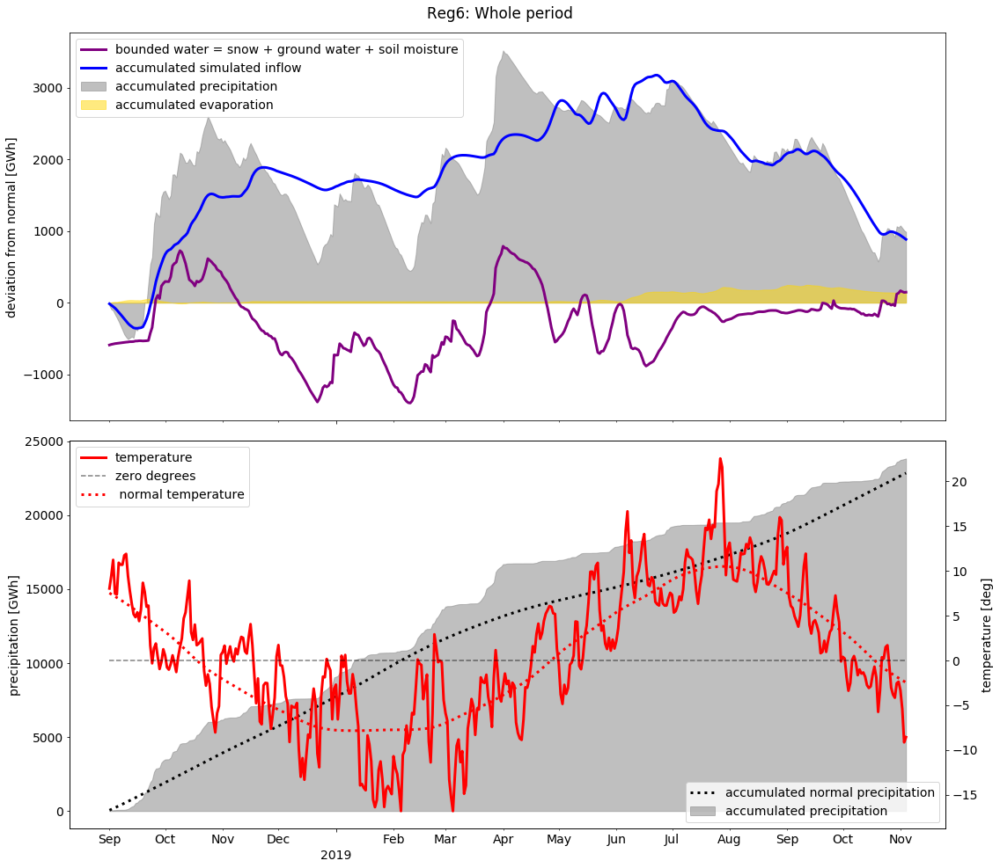

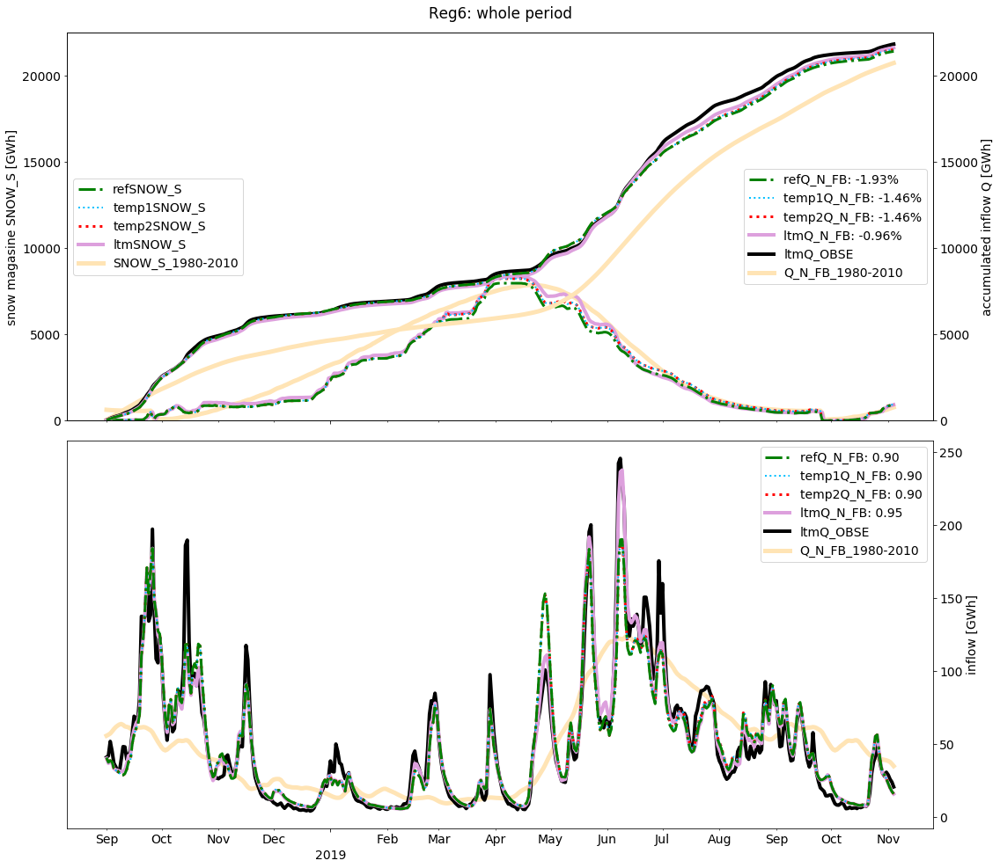








------------------------------------------------------------------------------------------------------------------------
                                                        Reg7
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-03-01 00:00): read from excel.
WARNING! Analysis end (2019-09-11): this script did not find a sufficient estimation of the end of the spring flod, used here last possible end.
snowjust_dict =  {'u12': ['Kobbelv-167.034'], 'u16': ['Båtsvat-173.011', 'Skjomen-173.001', 'SLangva-303.001']}

Models updated in explicit weeek:
u12: ['Kobbelv-167.034']
u16: ['Båtsvat-173.011', 'Skjomen-173.001', 'SLangva-303.001']


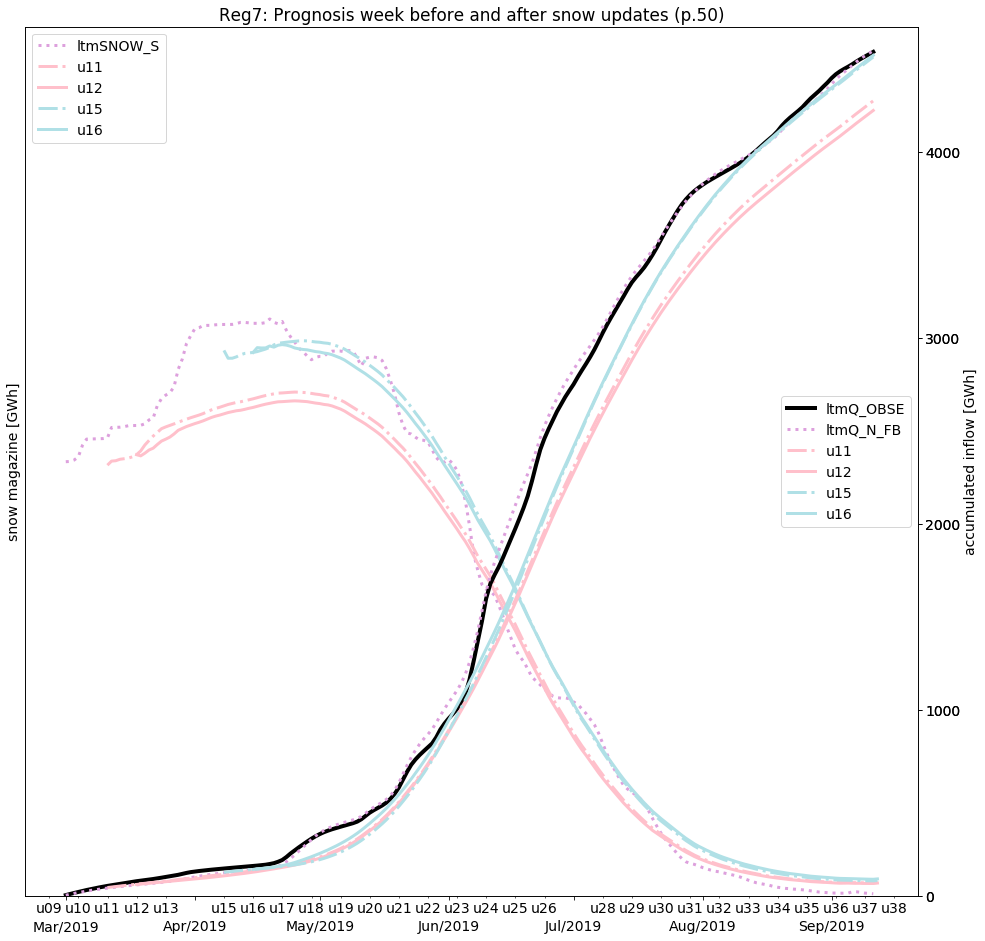

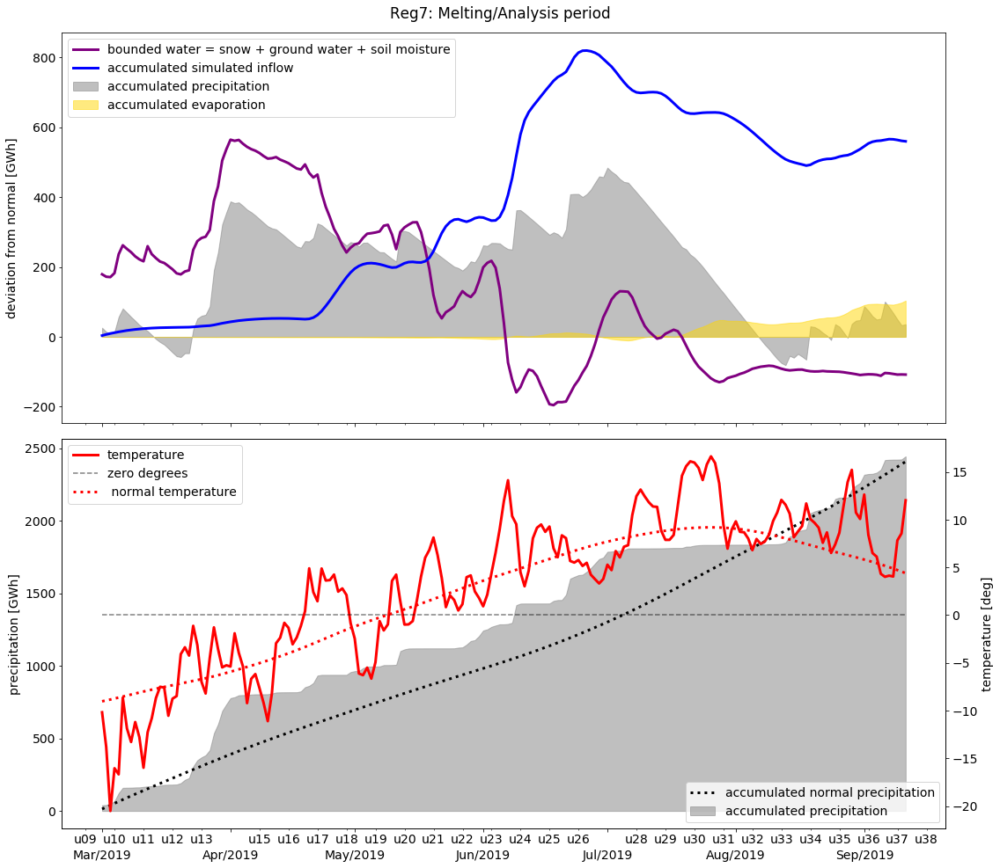

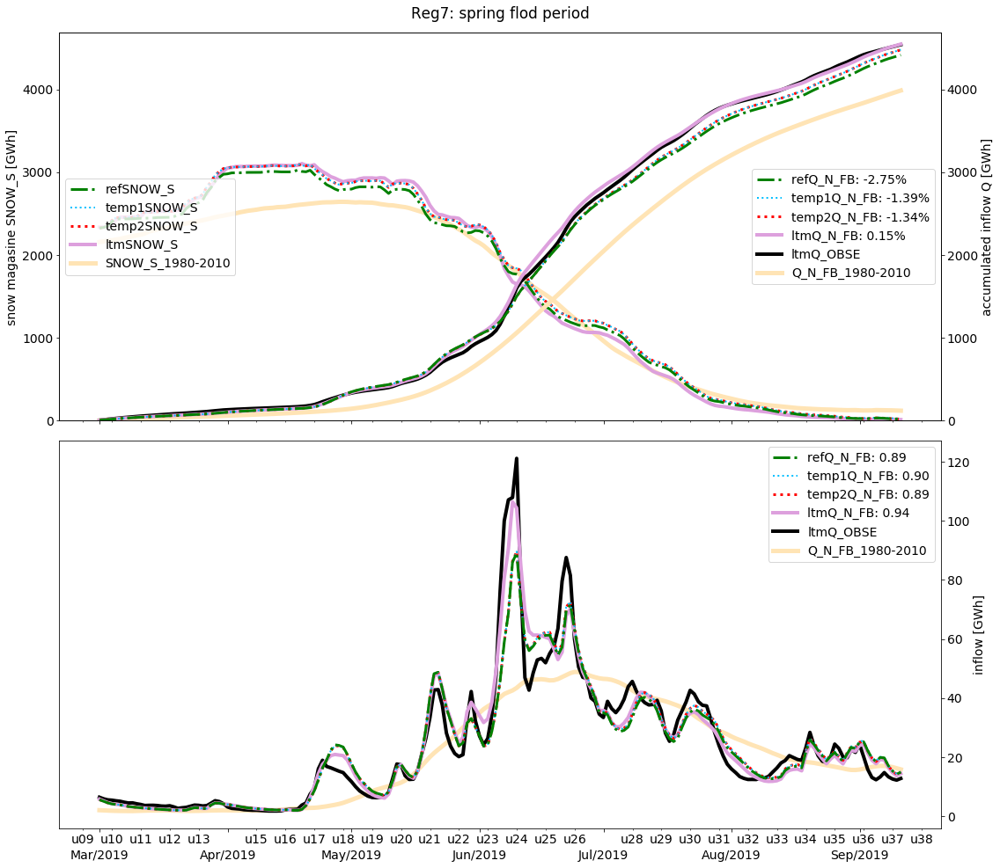

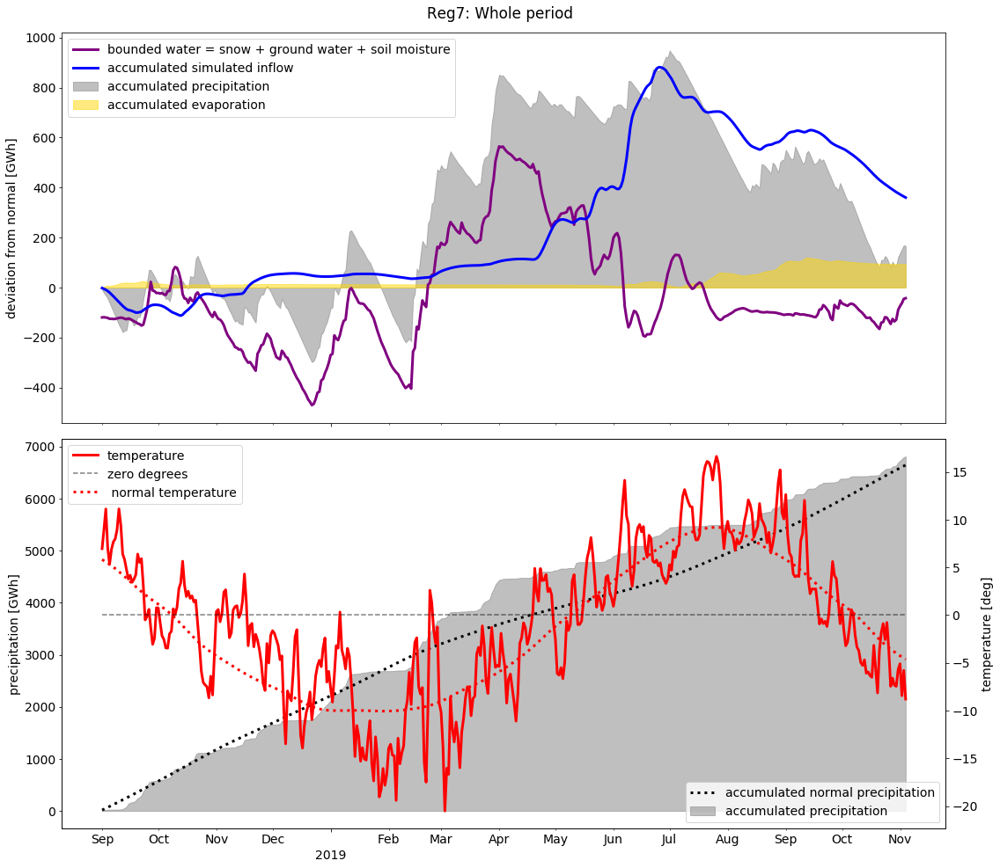

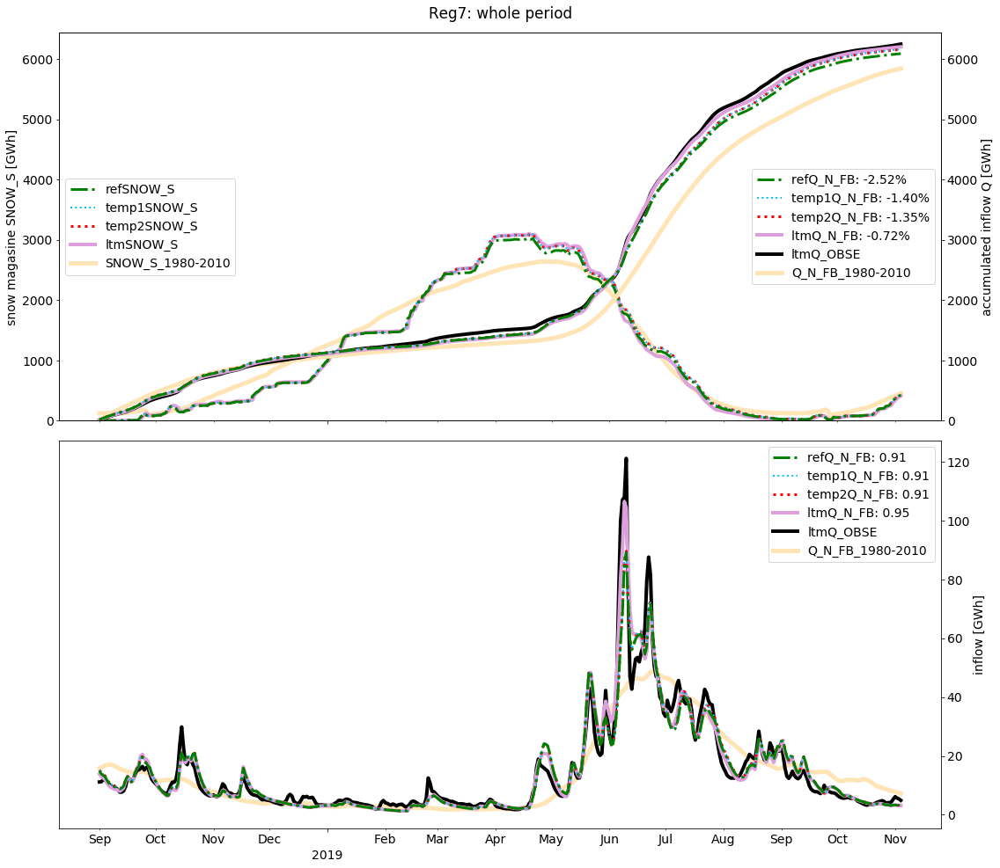








------------------------------------------------------------------------------------------------------------------------
                                                        Reg8
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-02-01 00:00): read from excel.
WARNING! Analysis end (2019-08-16): this script did not find a sufficient estimation of the end of the spring flod, used here date for the ref snow magasine minimum.
snowjust_dict =  {'u10': ['Adamsel-229.006']}

Models updated in explicit weeek:
u10: ['Adamsel-229.006']


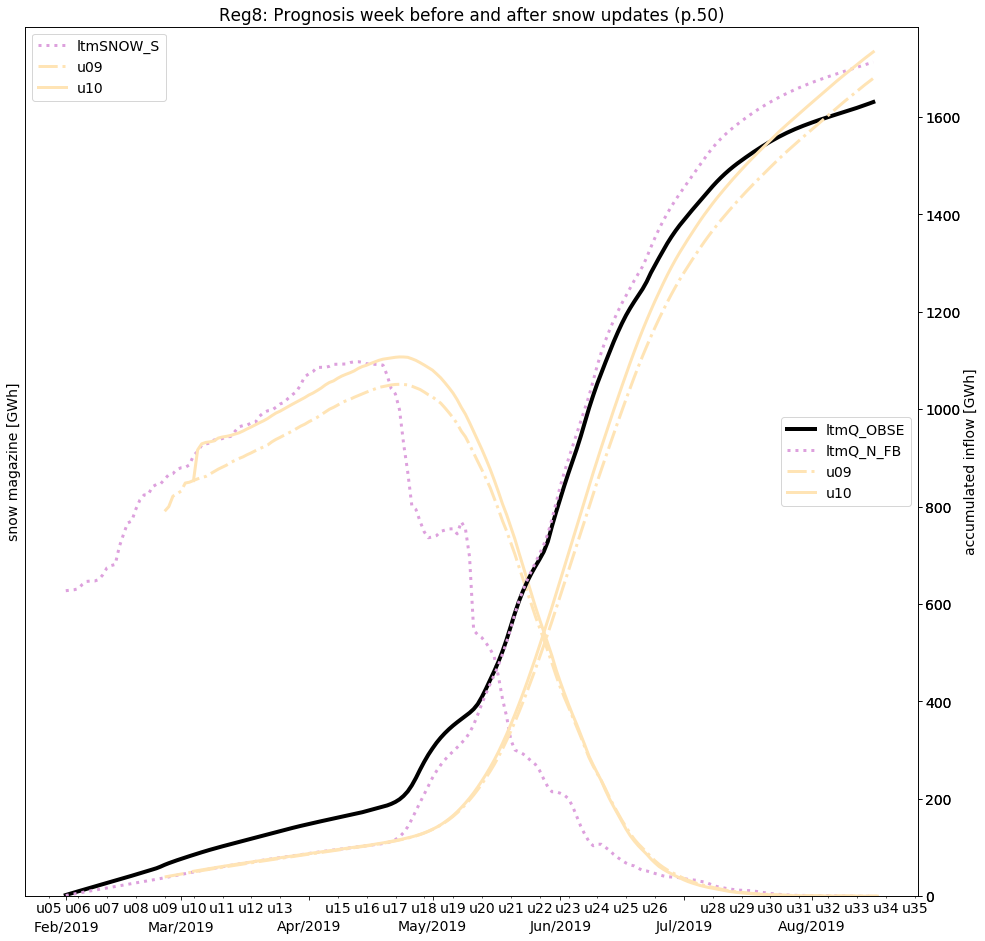

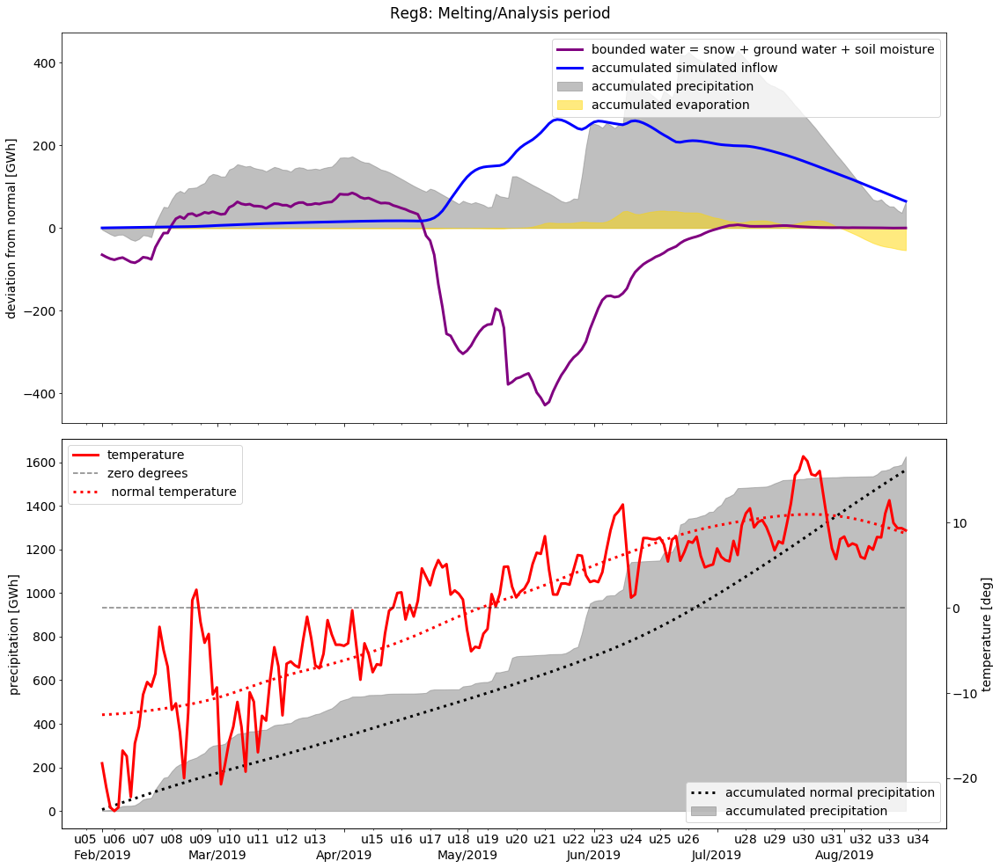

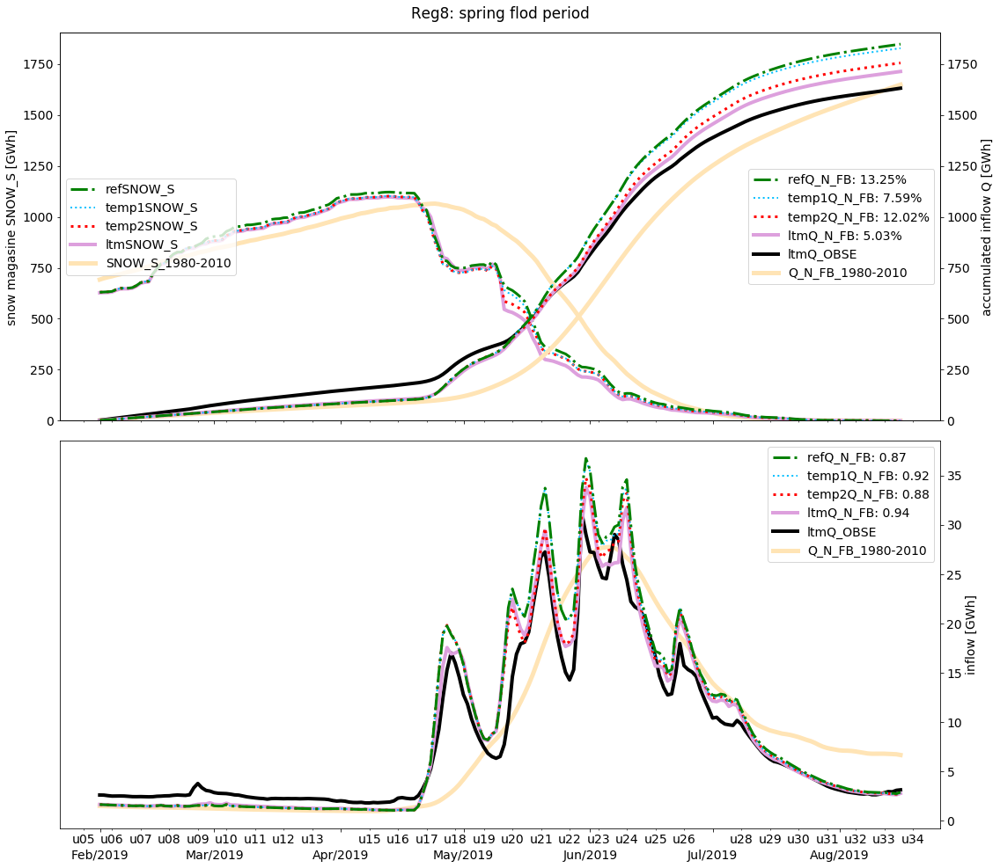

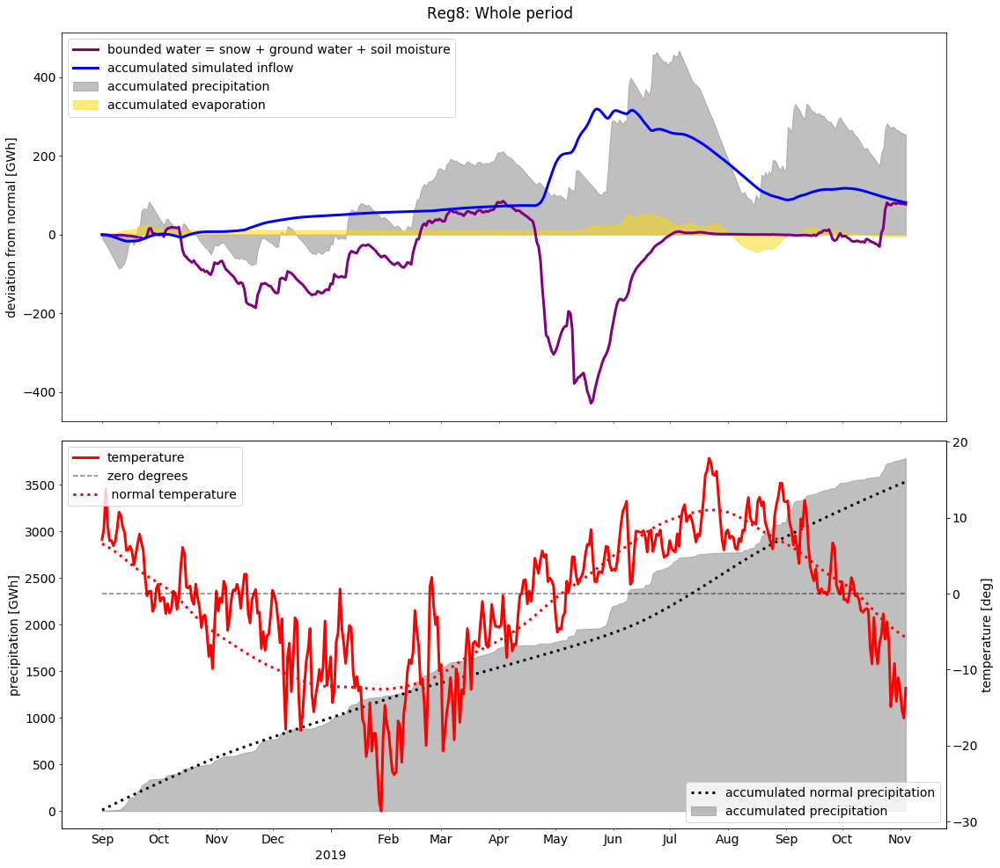

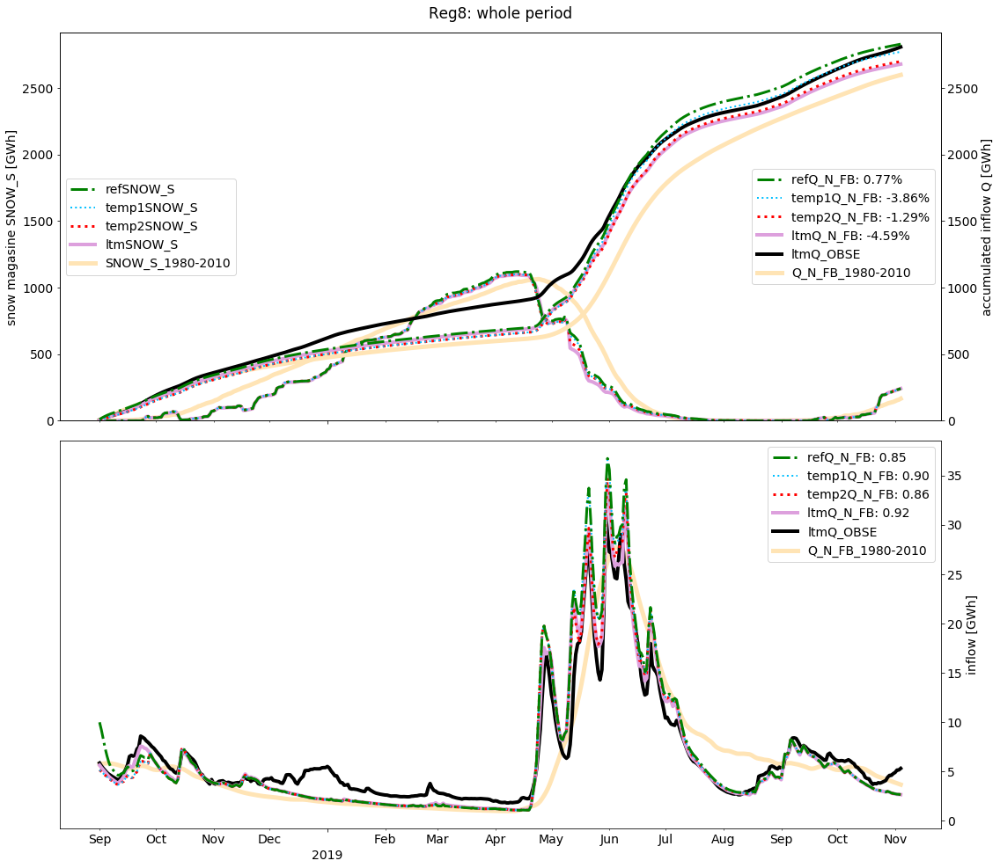

In [25]:
m.make_all(sheet, all_df, all_resources, analysis_periods_output, excel_output, excluded_keys, file)